In [1]:
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import cross_val_score, RepeatedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.multioutput import MultiOutputRegressor
from sklearn.svm import LinearSVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, mean_absolute_error

from scipy.stats import ttest_1samp, uniform, randint, ttest_ind
from scipy import stats
from statsmodels.stats import weightstats as stests

from functools import wraps
import time

In [3]:
plt.style.use('seaborn')

In [4]:
%run CoreFunction.ipynb

In [5]:
TEST_SIZE=0.15
n_comp = 0.95

In [6]:
scaler_min_max = MinMaxScaler()
scaler_z_score = StandardScaler()

# Electricity Price Forecast

# Ensemble Models

Ансамбловите методи са техника за машинно обучение, която комбинира няколко базови модела(обикновено по-слаби), за да произведе един оптимален, по-силен прогнозен модел. Трите са основните стандартни стратегии за обучение в ансамбъл за обучение в ансамбъл - bagging (пакетиране) , stacking (подреждане) и boosting (подсилване). 

- Bootstrap aggregation или накратко __bagging__ е метод за обучение в ансамбъл, който търси разнообразна група от членове на ансамбъла чрез промяна на данните за обучение. Това обикновено включва използване на един алгоритъм за машинно обучение, почти винаги необработено дърво на решенията и обучение на всеки модел на различна извадка от същия набор от данни за обучение. Прогнозите, направени от членовете на ансамбъла, след това се комбинират с помощта на проста статистика, като гласуване или осредняване. 
- Stacked Generalization или накратко __stacking__ е метод на ансамбъл, който работи по следния начин. Ползва един непроменен набор от данни за обучение и различни алгоритми наложени върху тези данни. После се прави модел който се обучава  как най-добре да комбинира прогнозите от различните алгоритми.

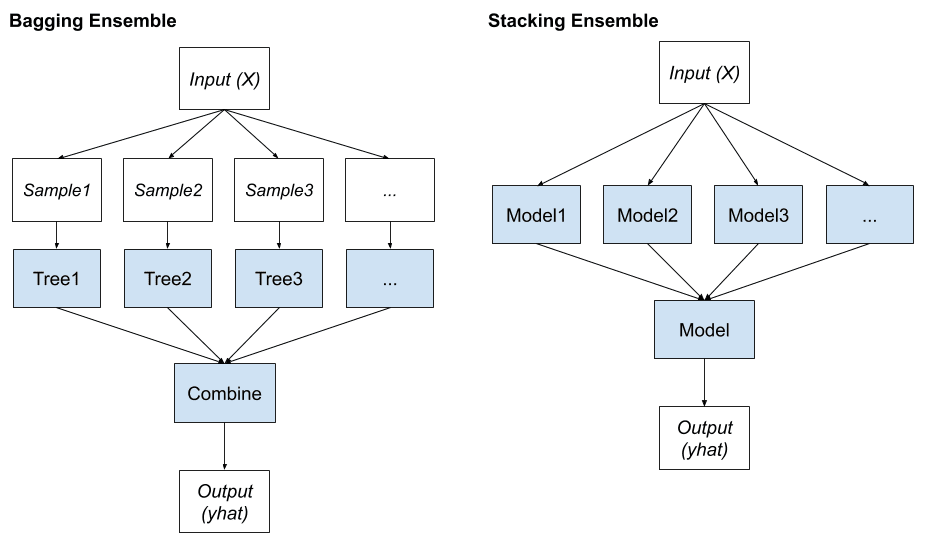

- При __boosting__ ключова е идеята за коригиране на грешки при прогнозирането. Моделите се напасват и се добавят към ансамбъла последователно, така че вторият модел се опитва да коригира прогнозите на първия модел, третият коригира втория модел и т.н. 

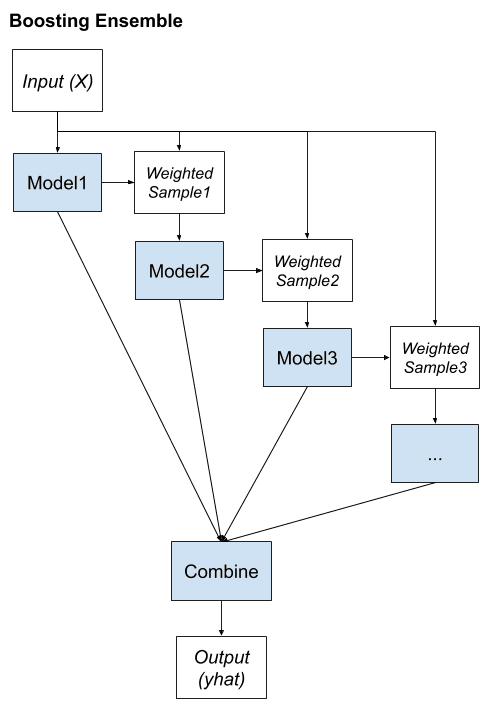

### Read Price and Normalize Data

In [7]:
price_target, price_attribute, df_data_price = read_data("price actual", r"data\df_data_price_ts720_120_24.csv")

In [8]:
price_atribute_train, price_atribute_test, price_target_train, price_target_test, price_attribute_col_names = scaled_data(price_target, price_attribute, TEST_SIZE, scaler_z_score)

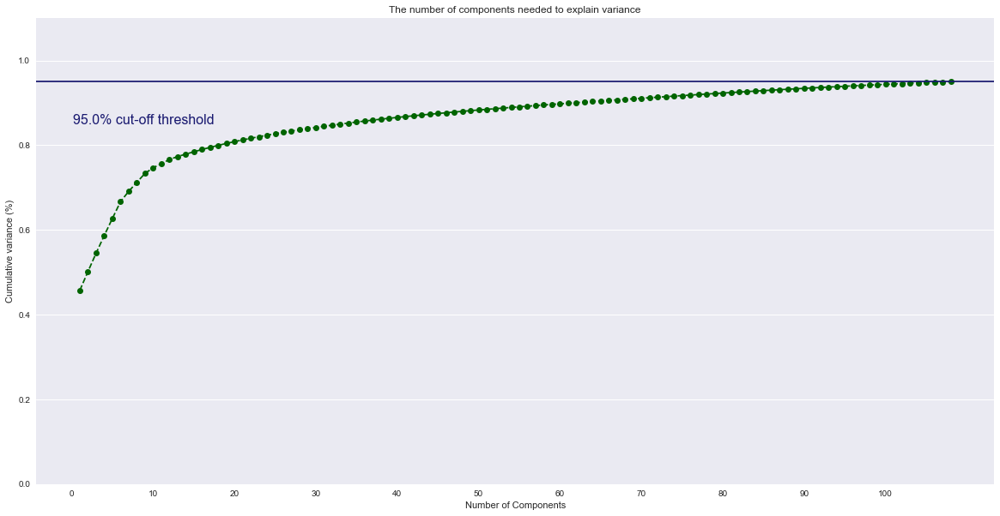

Transformed train shape: (29071, 108)
Transformed test shape: (5131, 108)
Function took 2.8353 seconds


In [9]:
most_important_features, PC_train, PC_test = PCA_feature_preprocessing(price_atribute_train, price_atribute_test, n_comp = n_comp, col_names = price_attribute.columns)

# Bagging Techniques

### Multi-Output Random Forest Regression

Ще опитаме първо да подобрим резултатите на базовите модели чрез популярната __bagging__ техника Random Forest Regression.
Основната идея на Random Forest е да се проведе ансамблово обучение на множество независими Decission Trees, обучени върху различни извадки от данните, направени на случаен принцип. Т.е. всяко дърво е различно и всяко дърво се представя по-слабо. Осреднявайки резултатите, очакваме да получим по-добър резултат разчитайки, че грешките на всеки модел са независими и различни. Базиран на дървета, този алгоритъм също има склонност към overfitting. Освен това, в сета има доста OHE-feature, които по принцип правят проблеми с дърветата.

In [10]:
RFR =RandomForestRegressor(random_state=42, bootstrap = True, warm_start = True, oob_score = True)
tuned_params = {
    "n_estimators": [30, 40, 50],
    "max_features": ["sqrt"],
    "max_depth": [10, 15, 20],
    "max_leaf_nodes":[600, 800, 1000]
}
cv = 3
price_random_forest_regression = get_grid_search(RFR, tuned_params, cv, price_atribute_train, price_target_train )

RandomForestRegressor(max_depth=20, max_features='sqrt', max_leaf_nodes=1000,
                      n_estimators=50, oob_score=True, random_state=42,
                      warm_start=True)
Function took 1819.5351 seconds


In [11]:
save_model(price_random_forest_regression, "#price_random_forest_regression.sav")

In [12]:
price_random_forest_regression = load_model("#price_random_forest_regression.sav")
price_random_forest_regression = price_random_forest_regression.best_estimator_

In [13]:
_, _, _ = evaluation_report(price_random_forest_regression, price_atribute_train, price_target_train)

Score Results:
Mean squared error: 38.70
Root mean squared error: 6.22
Mean absolute error: 4.80
Coefficient of determination: 0.8067
Predicted mean: 57.766 (10.967)


In [14]:
_, _, _ = evaluation_report(price_random_forest_regression, price_atribute_test, price_target_test)

Score Results:
Mean squared error: 51.62
Root mean squared error: 7.18
Mean absolute error: 5.40
Coefficient of determination: 0.7349
Predicted mean: 57.780 (10.394)


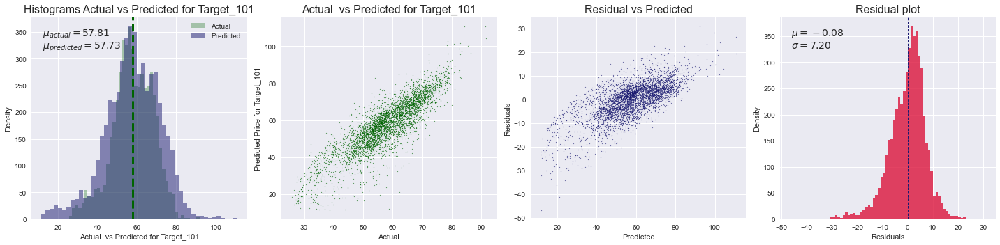

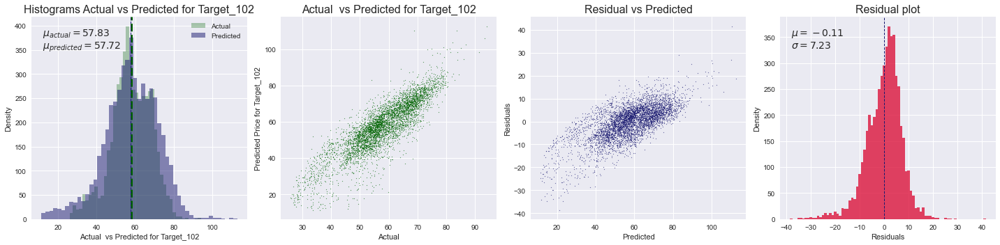

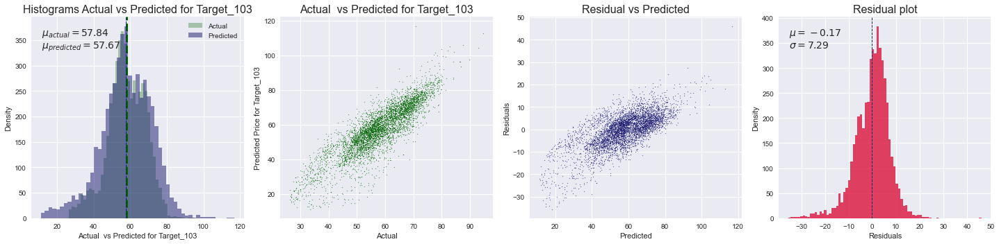

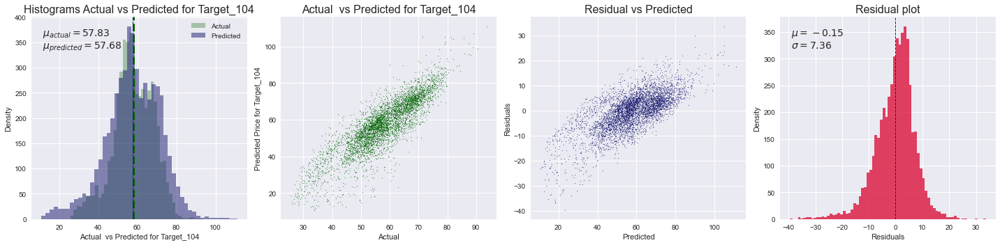

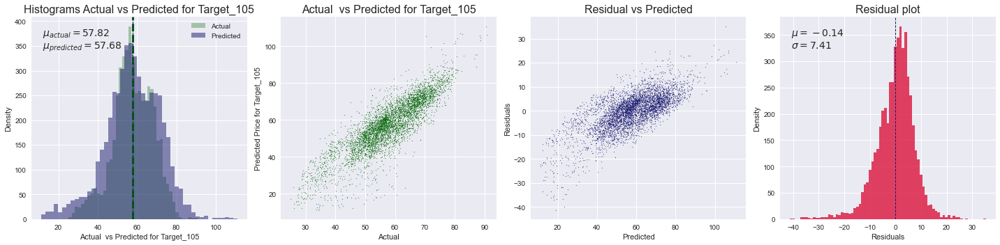

In [15]:
price_prediction = price_random_forest_regression.predict(price_atribute_test)
e_minus_o = get_and_plot_data(price_prediction, price_target_test, start_index=100, stop_index=105)

In [16]:
print(get_ttest (price_prediction, price_target_test, idx=101))

p-value: 0.2818969886603926
we are accepting null hypothesis


In [17]:
print(get_ztest (price_prediction, price_target_test, idx=101))

p-value: 0.2818463807768624
accept null hypothesis


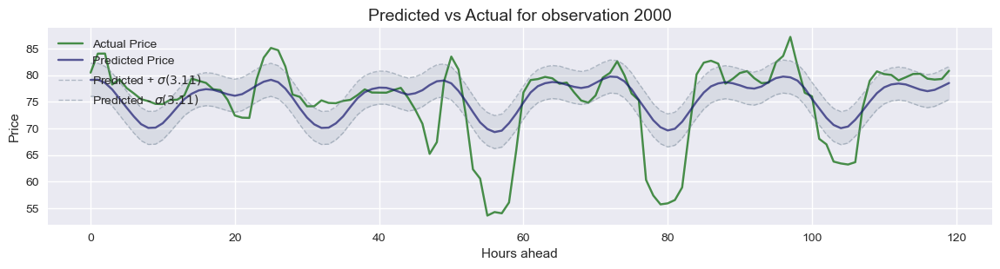

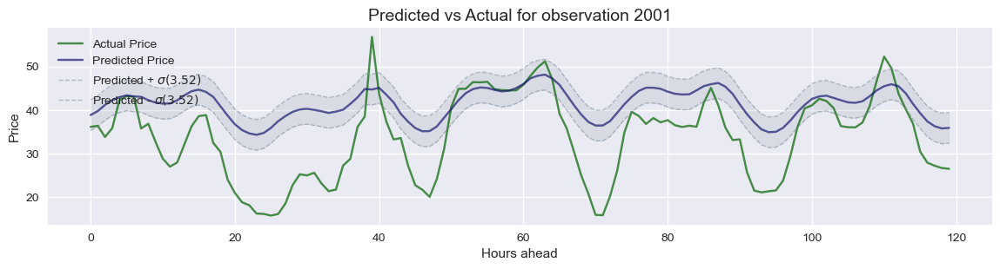

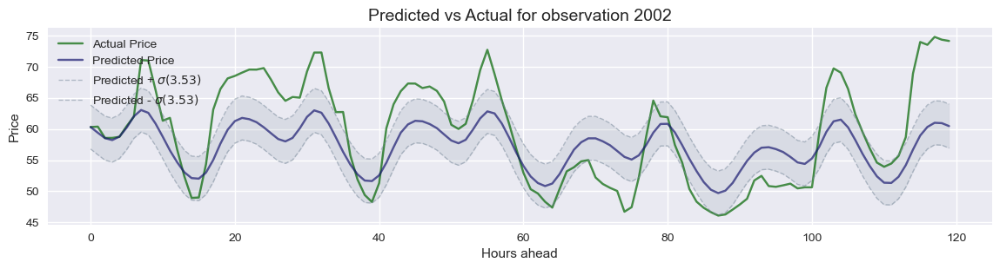

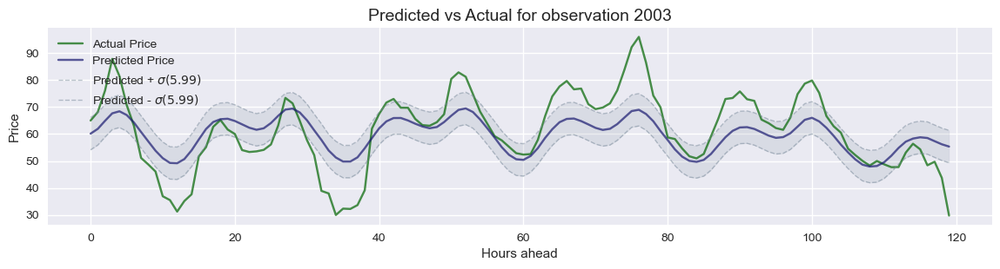

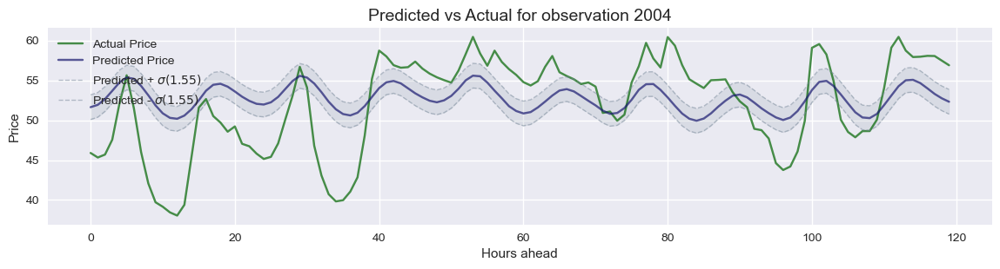

In [18]:
plot_actual_vs_prediction(price_prediction, price_target_test, variable_name = 'Price', start_inx = 2000, end_inx = 2005)

In [19]:
price_random_forest_regression_optimal = RandomForestRegressor(n_estimators=40, 
                                                               max_features="sqrt", 
                                                               max_leaf_nodes=600,  
                                                               max_depth=15, 
                                                               random_state=42).fit(price_atribute_train, price_target_train)

In [22]:
save_model(price_random_forest_regression_optimal, "#price_random_forest_regression_optimal.sav")

In [29]:
price_random_forest_regression_optimal = load_model("#price_random_forest_regression_optimal.sav")

In [30]:
_, _, _ = evaluation_report(price_random_forest_regression_optimal, price_atribute_train, price_target_train)

Score Results:
Mean squared error: 46.55
Root mean squared error: 6.82
Mean absolute error: 5.22
Coefficient of determination: 0.7675
Predicted mean: 57.768 (10.630)


In [31]:
_, _, _ = evaluation_report(price_random_forest_regression_optimal, price_atribute_test, price_target_test)

Score Results:
Mean squared error: 56.19
Root mean squared error: 7.49
Mean absolute error: 5.63
Coefficient of determination: 0.7114
Predicted mean: 57.773 (10.205)


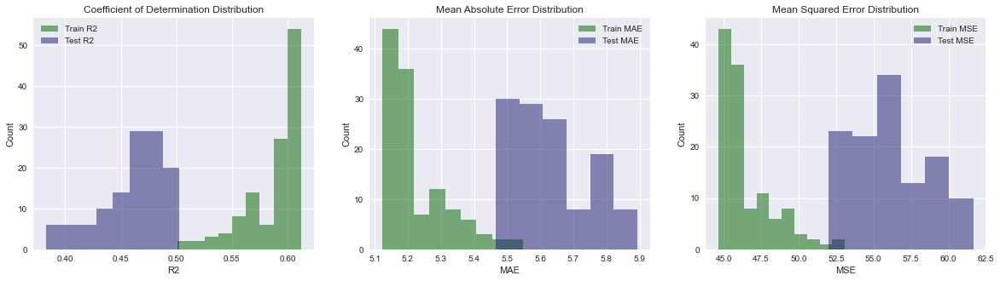

In [32]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(price_random_forest_regression_optimal, price_atribute_train, price_target_train, price_atribute_test, price_target_test )

In [33]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 3.346777223653149e-99
we are rejecting null hypothesis
p-value: 5.0608432643649536e-85
we are rejecting null hypothesis
p-value: 2.0645091027279544e-93
we are rejecting null hypothesis


In [34]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 8.156616546809672e-290
reject null hypothesis
p-value: 1.947910549137239e-208
reject null hypothesis
p-value: 7.164669292497174e-254
reject null hypothesis


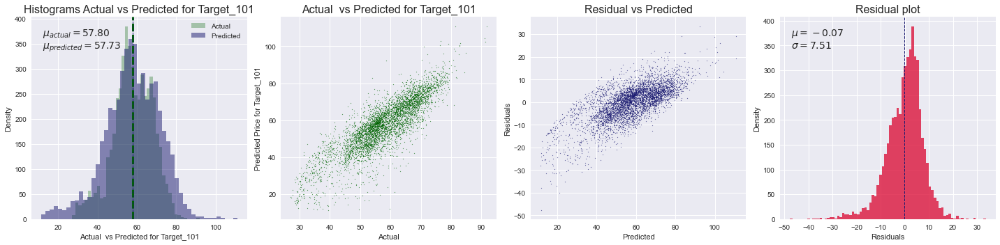

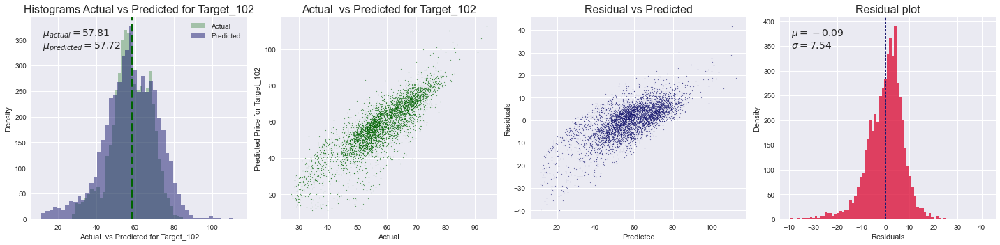

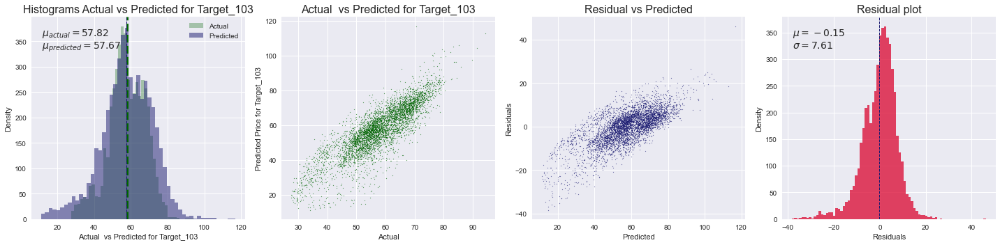

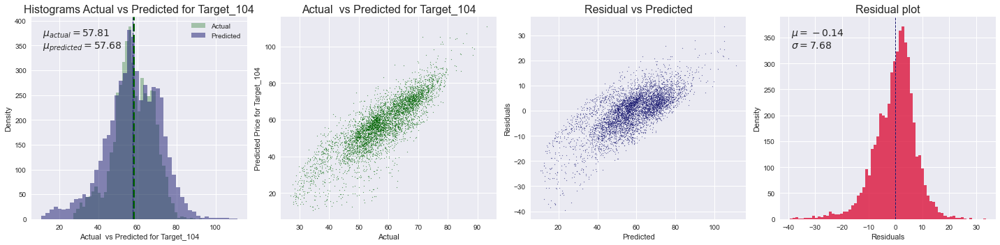

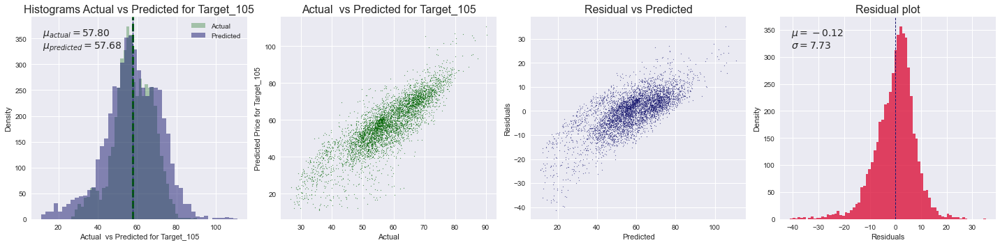

In [35]:
price_prediction = price_random_forest_regression_optimal.predict(price_atribute_test)
price_e_minus_o = get_and_plot_data(price_prediction, price_target_test, start_index=100, stop_index=105)

In [36]:
print(get_ttest (price_prediction, price_target_test, idx=101))

p-value: 0.38191197591461346
we are accepting null hypothesis


In [37]:
print(get_ztest (price_prediction, price_target_test, idx=101))

p-value: 0.3818710406060025
accept null hypothesis


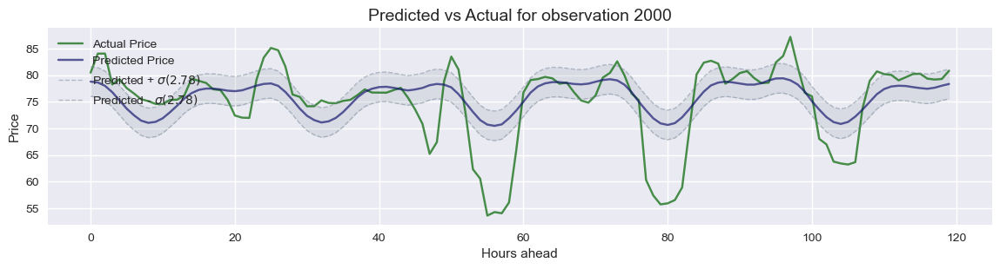

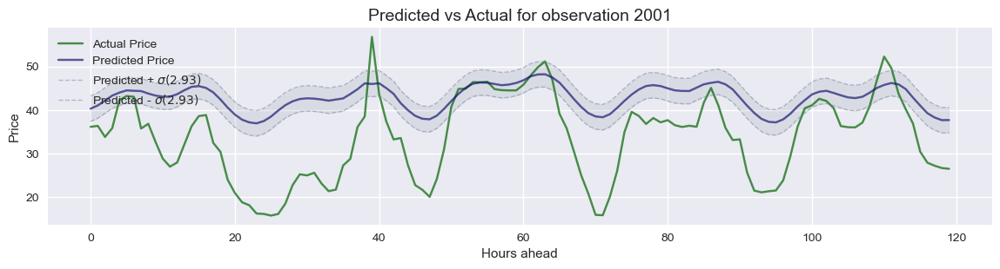

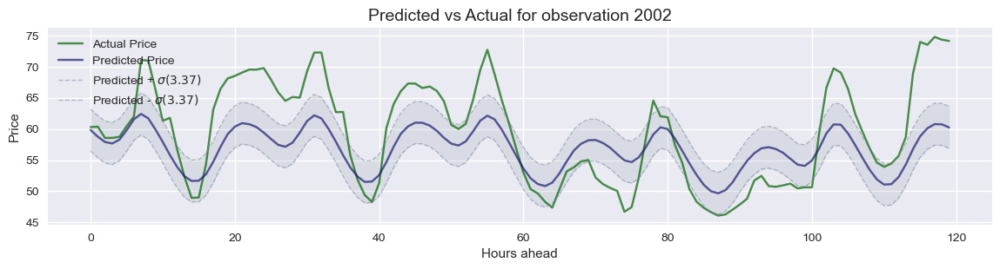

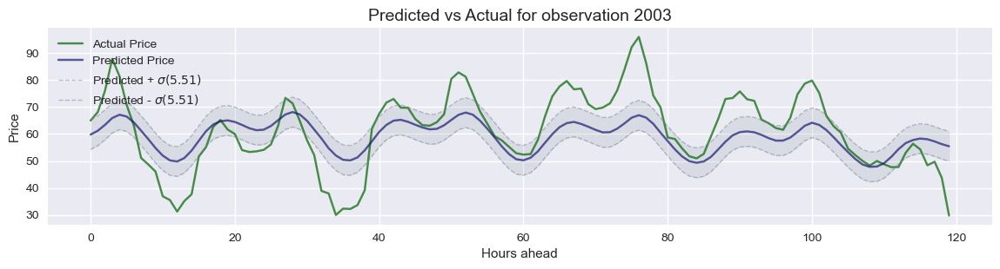

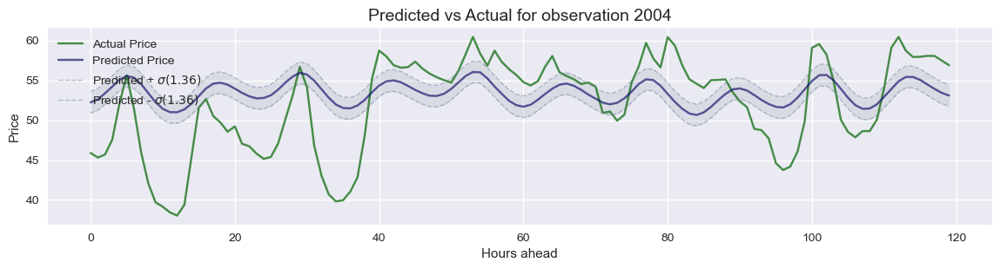

In [38]:
plot_actual_vs_prediction(price_prediction, price_target_test, variable_name = 'Price', start_inx = 2000, end_inx = 2005)

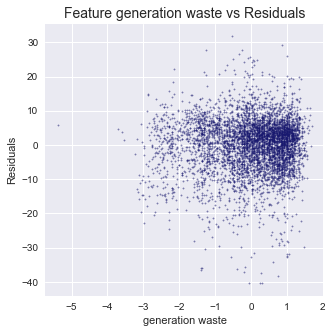

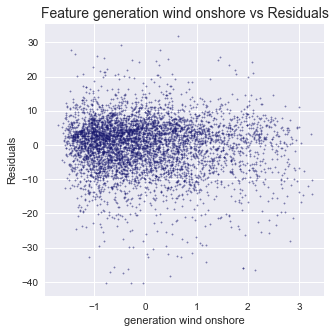

In [39]:
plot_feature_vs_residuals(price_atribute_test, price_attribute_col_names, 
                          price_prediction, price_target_test, start_index=10, stop_index=12, 
                          target_indx = 10, col_name = None) 

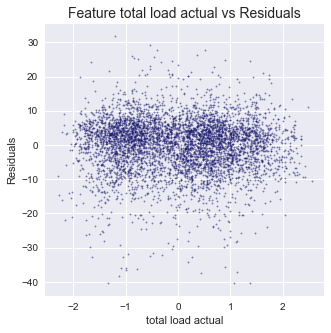

In [40]:
plot_feature_vs_residuals(price_atribute_test, price_attribute_col_names,  
                          price_prediction, price_target_test, start_index=155, stop_index=157, 
                          target_indx = 10, col_name = 'total load actual') 

###  Multi-Output  Random Forest with Reduce feature

In [24]:
RFR_pca =RandomForestRegressor(random_state=42)
tuned_params = {
    "n_estimators": [30, 40, 50],
    "max_features": ["sqrt"],
    "max_depth": [12, 15, 20],
    "max_leaf_nodes":[400, 600, 800]
}
cv = 3
price_random_forest_regression_pca = get_grid_search(RFR, tuned_params, cv, PC_train, price_target_train)

RandomForestRegressor(max_depth=20, max_features='sqrt', max_leaf_nodes=800,
                      n_estimators=30, oob_score=True, random_state=42,
                      warm_start=True)
Function took 883.5110 seconds


In [42]:
save_model(price_random_forest_regression_pca, "#price_random_forest_regression_pca.sav")

In [43]:
price_random_forest_regression_pca = load_model("#price_random_forest_regression_pca.sav")
price_random_forest_regression_pca = price_random_forest_regression_pca.best_estimator_

In [44]:
_, _, _ = evaluation_report(price_random_forest_regression_pca, PC_train, price_target_train)

Score Results:
Mean squared error: 47.27
Root mean squared error: 6.87
Mean absolute error: 5.31
Coefficient of determination: 0.7639
Predicted mean: 57.758 (9.646)


In [45]:
_, _, _ = evaluation_report(price_random_forest_regression_pca, PC_test, price_target_test)

Score Results:
Mean squared error: 58.30
Root mean squared error: 7.63
Mean absolute error: 5.80
Coefficient of determination: 0.7006
Predicted mean: 57.794 (8.788)


In [46]:
price_random_forest_pca_optimal = RandomForestRegressor(n_estimators=30, max_features="sqrt", max_leaf_nodes=1000,  max_depth=25, random_state=42).fit(PC_train, price_target_train)

In [39]:
_, _, _ = evaluation_report(price_random_forest_pca_optimal, PC_train, price_target_train)

Score Results:
Mean squared error: 43.23
Root mean squared error: 6.57
Mean absolute error: 5.09
Coefficient of determination: 0.7841
Predicted mean: 57.758 (9.933)


In [40]:
_, _, _ = evaluation_report(price_random_forest_pca_optimal, PC_test, price_target_test)

Score Results:
Mean squared error: 55.78
Root mean squared error: 7.47
Mean absolute error: 5.68
Coefficient of determination: 0.7135
Predicted mean: 57.793 (8.966)


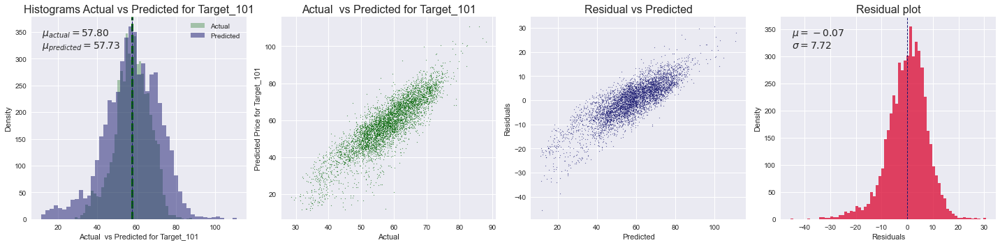

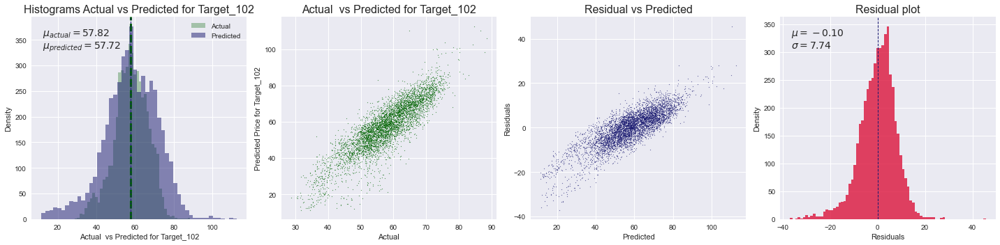

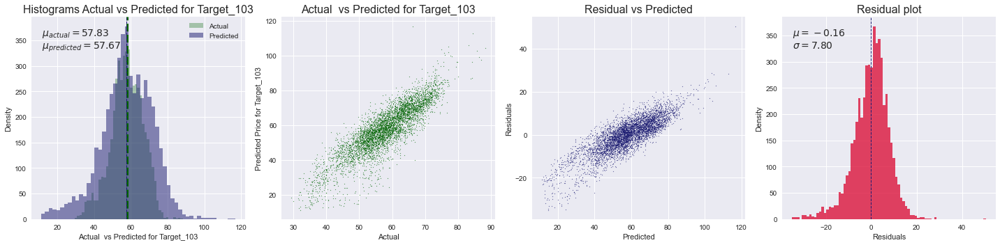

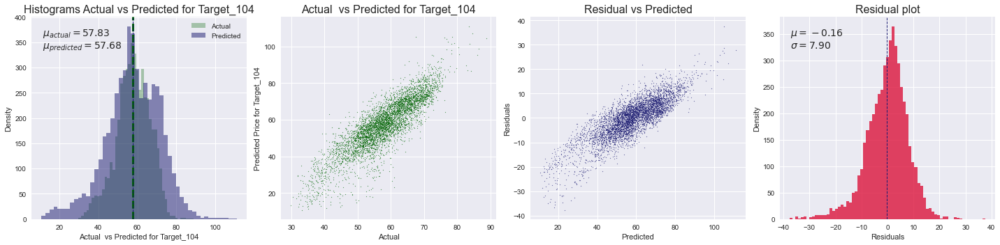

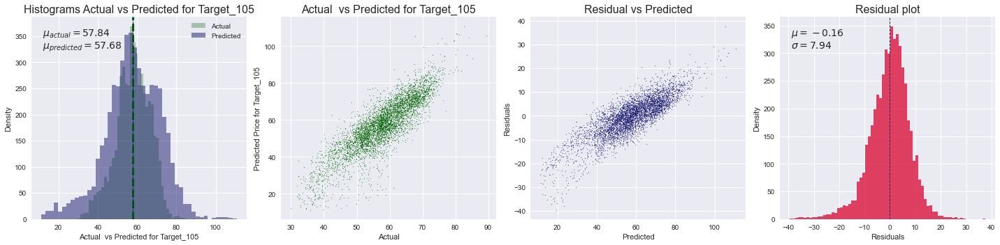

In [41]:
price_prediction_pca = price_random_forest_regression_pca.predict(PC_test)
e_minus_o = get_and_plot_data(price_prediction_pca, price_target_test, start_index=100, stop_index=105)

In [42]:
print(get_ttest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.3737419643332931
we are accepting null hypothesis


In [43]:
print(get_ztest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.37370025237143867
accept null hypothesis


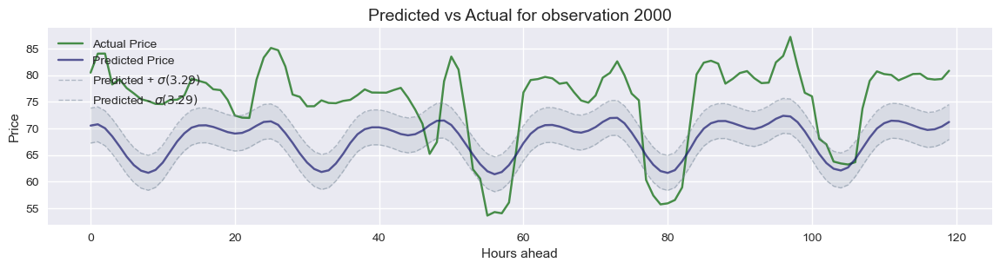

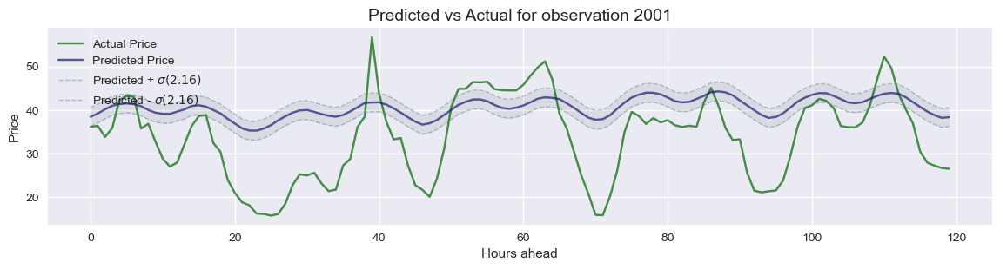

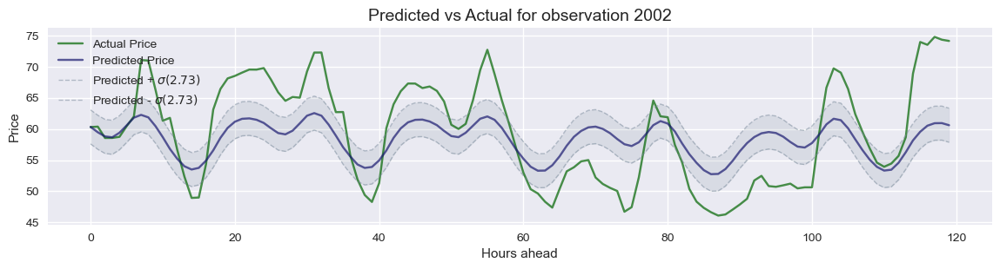

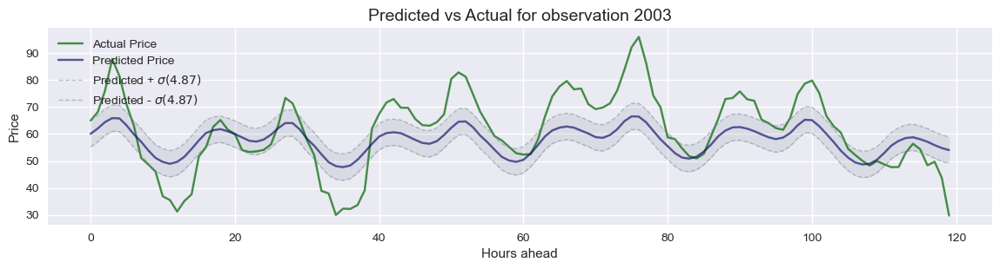

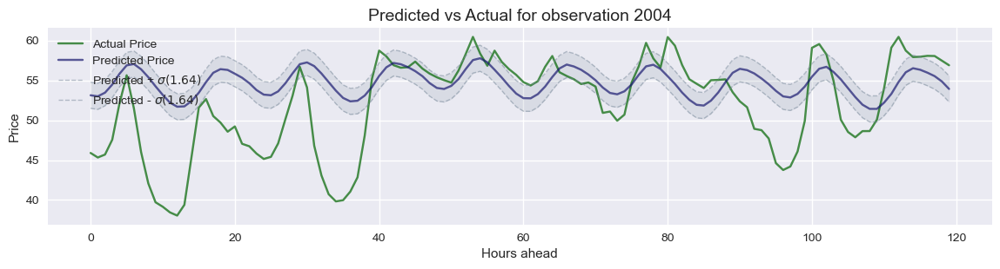

In [44]:
plot_actual_vs_prediction(price_prediction_pca, price_target_test, variable_name = 'Price', start_inx = 2000, end_inx = 2005)

# Boosting Techniques

AdaBoostRegressor е мета-оценител, който приема слаб базов оценител и след това прави допълнителни копия на този базов оценител върху същия набор от данни, но където са теглата на екземплярите са коригирани според грешката на текущата прогноза. В проекта са тествани модели с базов оценител DecisionTreeRegressor, както и LinearSVR. На долната фигура е илюстриран принципа на работа на AdaBoostRegressor.

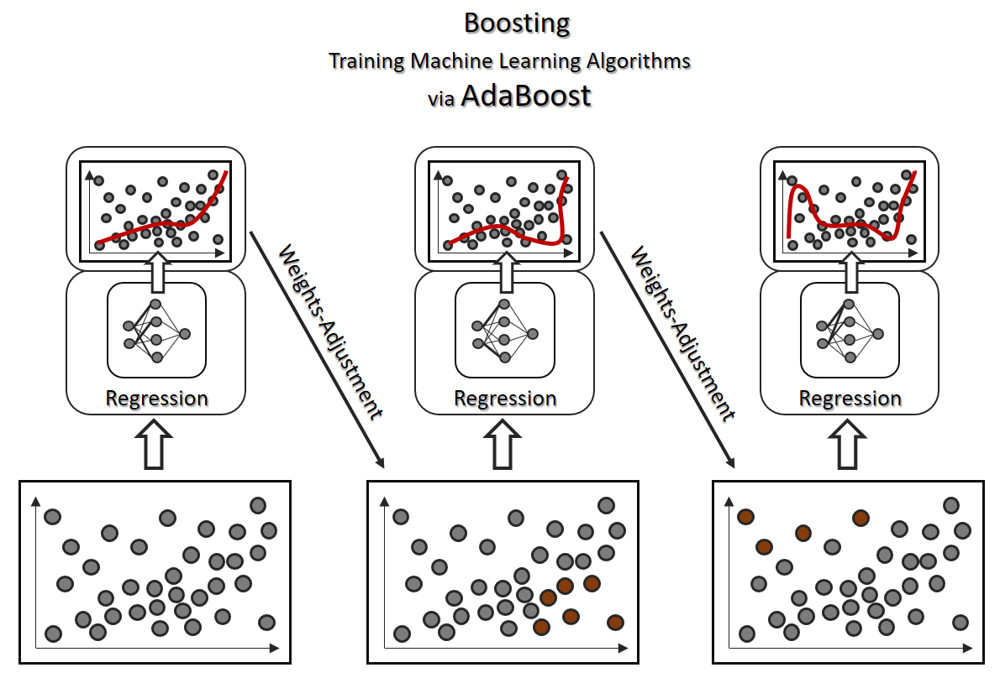

###  Multi-Output  AdaBoost with DecisionTreeRegressor

Първоначално тестване за скорост на алгоритъма със случайно подбрани хиперпараметри.

In [14]:
tree_pca = DecisionTreeRegressor(max_depth=10, min_samples_leaf = 100)

@timeit
def ada_dtr(estimator, att, target):
    ada_pca = AdaBoostRegressor(base_estimator = estimator, n_estimators = 10, learning_rate = 0.1)
    ada_wrapped_pca = MultiOutputRegressor(estimator=ada_pca)
    ada_wrapped_pca.fit(att, target)
    return ada_wrapped_pca
ada_wrapped_pca = ada_dtr(tree_pca, PC_train, price_target_train)

Function took 3136.4308 seconds


In [47]:
save_model(ada_wrapped_pca, "#ada_wrapped_pca_base.sav")

In [48]:
ada_wrapped_pca = load_model("#ada_wrapped_pca_base.sav")

In [49]:
_, _, _ = evaluation_report(ada_wrapped_pca, PC_train, price_target_train)

Score Results:
Mean squared error: 44.12
Root mean squared error: 6.64
Mean absolute error: 4.89
Coefficient of determination: 0.7797
Predicted mean: 57.731 (11.633)


In [50]:
_, _, _ = evaluation_report(ada_wrapped_pca, PC_test, price_target_test)

Score Results:
Mean squared error: 49.61
Root mean squared error: 7.04
Mean absolute error: 5.18
Coefficient of determination: 0.7451
Predicted mean: 57.782 (11.388)


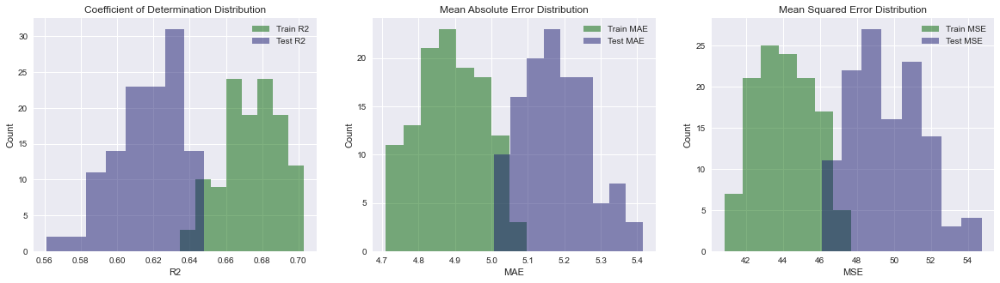

In [51]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(ada_wrapped_pca, PC_train, price_target_train, PC_test, price_target_test )

In [52]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 4.41541792990438e-71
we are rejecting null hypothesis
p-value: 9.651066820250319e-68
we are rejecting null hypothesis
p-value: 1.6017624869090877e-66
we are rejecting null hypothesis


In [53]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 1.7829121466903028e-147
reject null hypothesis
p-value: 3.751856852307758e-135
reject null hypothesis
p-value: 7.612095950667265e-131
reject null hypothesis


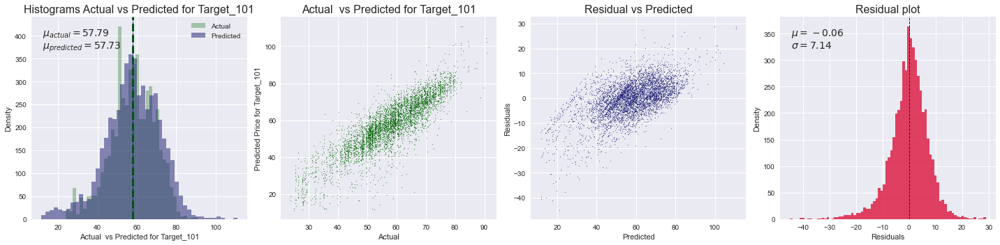

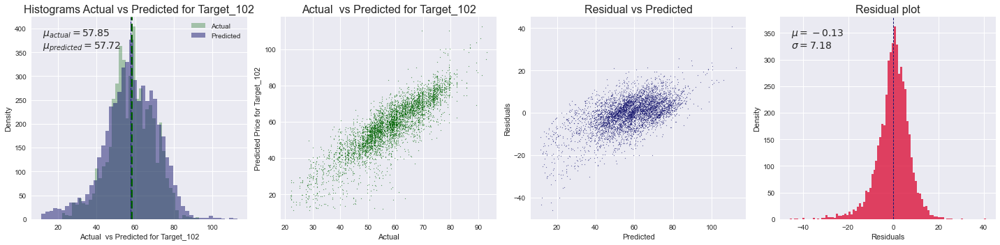

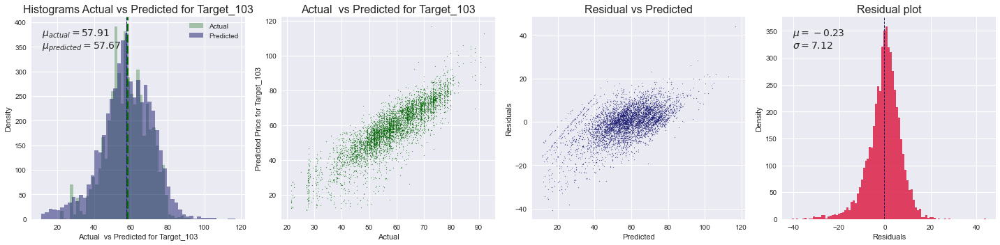

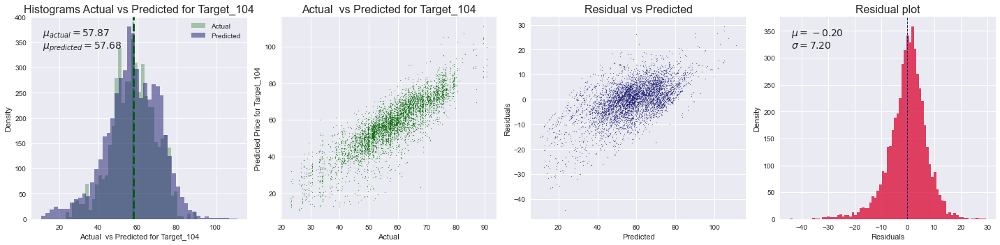

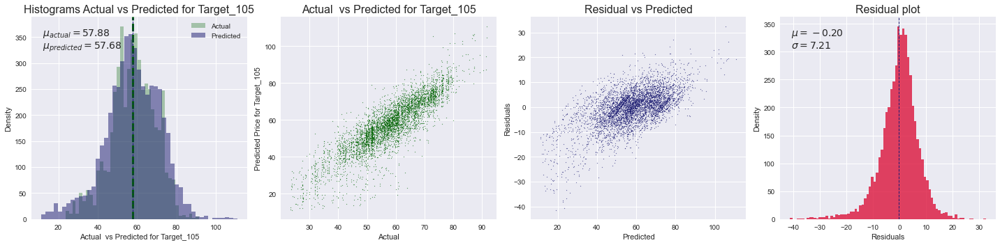

In [54]:
price_prediction_pca = ada_wrapped_pca.predict(PC_test)
e_minus_o = get_and_plot_data(price_prediction_pca, price_target_test, start_index=100, stop_index=105)

In [55]:
print(get_ttest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.20997719210249366
we are accepting null hypothesis


In [56]:
print(get_ztest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.20992006005048203
accept null hypothesis


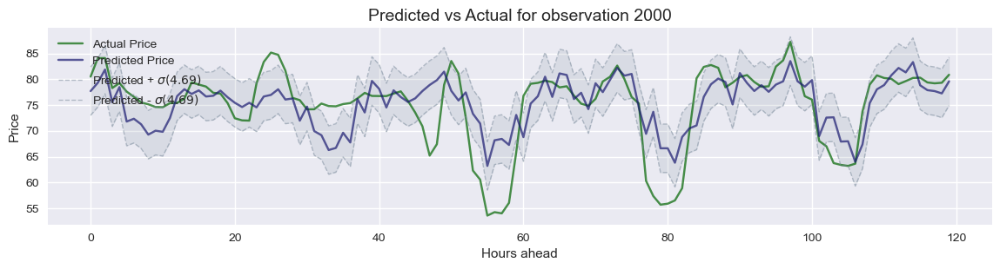

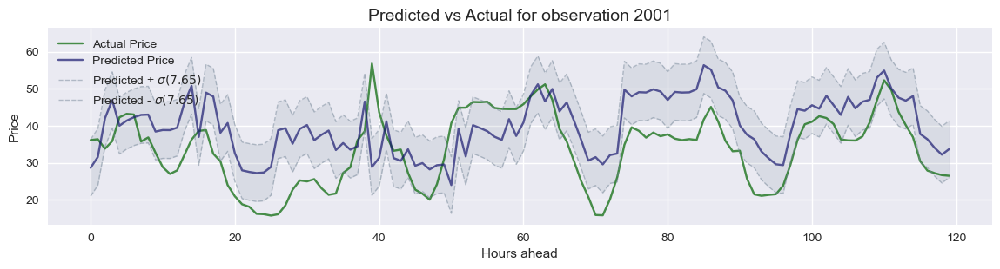

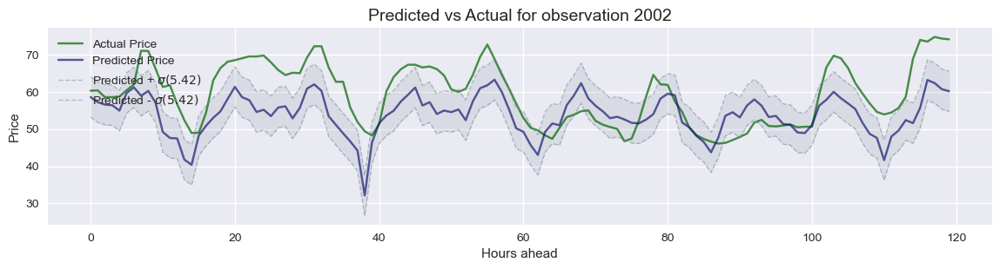

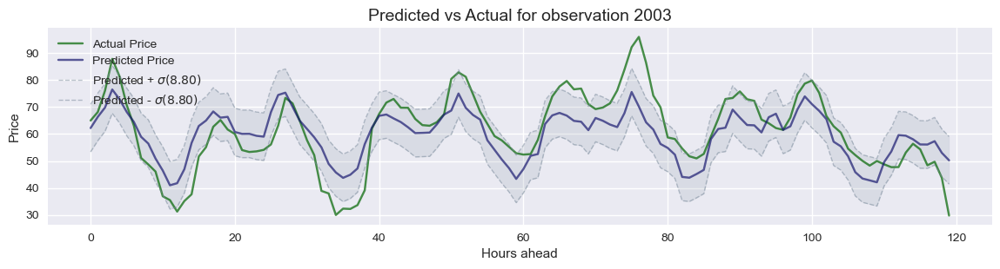

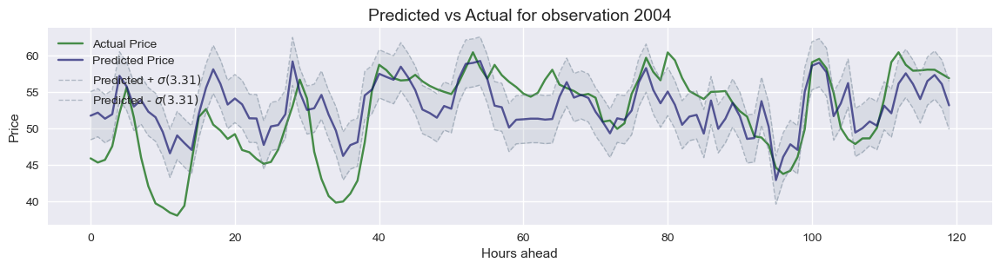

In [57]:
plot_actual_vs_prediction(price_prediction_pca, price_target_test, variable_name = 'Price', start_inx = 2000, end_inx = 2005)

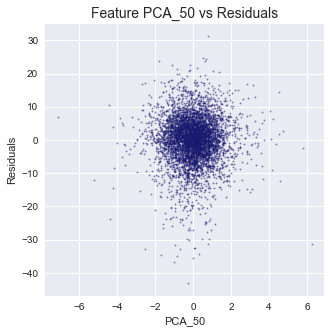

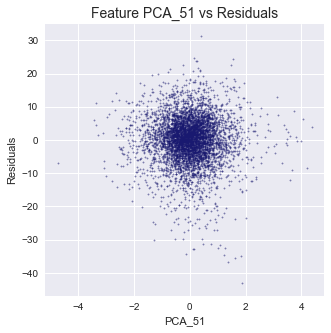

In [58]:
 plot_feature_vs_residuals_PCA(PC_test, price_prediction_pca, price_target_test, 
                              start_index=50, stop_index=52, target_indx = 119, col_name = None) 

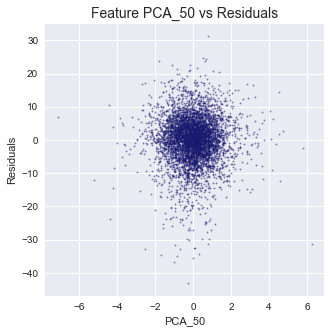

In [59]:
plot_feature_vs_residuals_PCA(PC_test, price_prediction_pca, price_target_test, 
                              start_index=45, stop_index=52, target_indx = 119, col_name = 'PCA_50') 

In [107]:
tree_pca = DecisionTreeRegressor()
params = {
    "estimator__learning_rate": [0.01, 1],
    "estimator__n_estimators": [10], 
    "estimator__base_estimator__max_depth":[15,20],
    "estimator__base_estimator__max_features": ["sqrt"],
    "estimator__base_estimator__min_samples_leaf": [150,200],     
}

ada_pca = AdaBoostRegressor(base_estimator = tree_pca)
ada_wrapped_pca = MultiOutputRegressor(estimator=ada_pca)

adaboost_pca = get_grid_search(ada_wrapped_pca,  params, 3, PC_train, price_target_train )

MultiOutputRegressor(estimator=AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=20,
                                                                                      max_features='sqrt',
                                                                                      min_samples_leaf=150),
                                                 learning_rate=1,
                                                 n_estimators=10))
Function took 1968.6586 seconds


In [108]:
save_model(adaboost_pca, "#ada_wrapped_pca_gs.sav")

In [ ]:
adaboost_pca = load_model("#ada_wrapped_pca_gs.sav")
adaboost_pca = adaboost_pca.best_estimator_

In [109]:
_, _, _ = evaluation_report(adaboost_pca, PC_train, price_target_train)

Score Results:
Mean squared error: 62.09
Root mean squared error: 7.88
Mean absolute error: 6.20
Coefficient of determination: 0.6899
Predicted mean: 57.077 (9.298)


In [110]:
_, _, _ = evaluation_report(adaboost_pca, PC_test, price_target_test)

Score Results:
Mean squared error: 69.92
Root mean squared error: 8.36
Mean absolute error: 6.48
Coefficient of determination: 0.6407
Predicted mean: 57.102 (8.928)


In [111]:
pd.DataFrame(adaboost_pca.cv_results_).T
# col - 1, 5

,0,1,2,3,4,5,6,7
mean_fit_time,481.047206,447.500546,461.134907,429.105857,484.061305,481.52143,508.283538,476.297368
std_fit_time,2.999373,1.341163,3.039671,2.207128,2.50007,21.011497,2.794819,0.260341
mean_score_time,22.460009,16.189658,17.676115,14.304492,15.770873,15.416536,17.464218,17.671151
std_score_time,0.217728,0.141148,0.881866,0.657299,0.525311,0.934098,0.698104,1.685704
param_estimator__base_estimator__max_depth,15,15,15,15,20,20,20,20
param_estimator__base_estimator__max_features,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt
param_estimator__base_estimator__min_samples_leaf,150,150,200,200,150,150,200,200
param_estimator__learning_rate,0.01,1,0.01,1,0.01,1,0.01,1
param_estimator__n_estimators,10,10,10,10,10,10,10,10
params,"{'estimator__base_estimator__max_depth': 15, '...","{'estimator__base_estimator__max_depth': 15, '...","{'estimator__base_estimator__max_depth': 15, '...","{'estimator__base_estimator__max_depth': 15, '...","{'estimator__base_estimator__max_depth': 20, '...","{'estimator__base_estimator__max_depth': 20, '...","{'estimator__base_estimator__max_depth': 20, '...","{'estimator__base_estimator__max_depth': 20, '..."


In [112]:
tree_pca = DecisionTreeRegressor()
params = {
    "estimator__learning_rate": [0.01, 1],
    "estimator__n_estimators": [10], 
    "estimator__base_estimator__max_depth":[5, 8],
    "estimator__base_estimator__max_features": ["sqrt"],
    "estimator__base_estimator__min_samples_leaf": [80,120],     
}

ada_pca = AdaBoostRegressor(base_estimator = tree_pca)
ada_wrapped_pca = MultiOutputRegressor(estimator=ada_pca)

adaboost_pca_2 = get_grid_search(ada_wrapped_pca,  params, 3, PC_train, price_target_train)

MultiOutputRegressor(estimator=AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=8,
                                                                                      max_features='sqrt',
                                                                                      min_samples_leaf=80),
                                                 learning_rate=1,
                                                 n_estimators=10))
Function took 1543.8751 seconds


In [113]:
save_model(adaboost_pca_2, "#ada_wrapped_pca_gs_2.sav")

In [114]:
_, _, _ = evaluation_report(adaboost_pca_2, PC_train, price_target_train)

Score Results:
Mean squared error: 73.63
Root mean squared error: 8.57
Mean absolute error: 6.83
Coefficient of determination: 0.6323
Predicted mean: 57.089 (8.451)


In [115]:
_, _, _ = evaluation_report(adaboost_pca_2, PC_test, price_target_test)

Score Results:
Mean squared error: 80.52
Root mean squared error: 8.97
Mean absolute error: 7.03
Coefficient of determination: 0.5861
Predicted mean: 57.155 (8.080)


In [116]:
pd.DataFrame(adaboost_pca_2.cv_results_).T
# по лоши от предходния grid search

,0,1,2,3,4,5,6,7
mean_fit_time,311.741504,291.732514,313.742158,297.193141,432.785937,405.454631,415.232895,364.060499
std_fit_time,0.481256,0.777347,4.956276,0.503511,0.535023,0.775403,16.036715,0.880696
mean_score_time,22.391058,16.193195,20.256222,14.878169,17.431749,14.096766,12.370688,10.602097
std_score_time,0.040038,0.084031,2.544001,1.229252,0.147469,0.356271,0.853384,0.482607
param_estimator__base_estimator__max_depth,5,5,5,5,8,8,8,8
param_estimator__base_estimator__max_features,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt,sqrt
param_estimator__base_estimator__min_samples_leaf,80,80,120,120,80,80,120,120
param_estimator__learning_rate,0.01,1,0.01,1,0.01,1,0.01,1
param_estimator__n_estimators,10,10,10,10,10,10,10,10
params,"{'estimator__base_estimator__max_depth': 5, 'e...","{'estimator__base_estimator__max_depth': 5, 'e...","{'estimator__base_estimator__max_depth': 5, 'e...","{'estimator__base_estimator__max_depth': 5, 'e...","{'estimator__base_estimator__max_depth': 8, 'e...","{'estimator__base_estimator__max_depth': 8, 'e...","{'estimator__base_estimator__max_depth': 8, 'e...","{'estimator__base_estimator__max_depth': 8, 'e..."


### Multi-Output AdaBoost with LinearSVR

In [103]:
# Тестваме за скорост и после със различни параметри 
svr = LinearSVR(C=0.1, max_iter = 1000, tol = 0.001, random_state=42,  loss='squared_epsilon_insensitive', dual=False)

@timeit
def ada_svr(estimator, att, target):
    ada_pca = AdaBoostRegressor(base_estimator = estimator, n_estimators = 10, learning_rate = 0.01)
    ada_wrapped_pca = MultiOutputRegressor(estimator=ada_pca)
    ada_wrapped_pca.fit(att, target)
    return ada_wrapped_pca

ada_wrapped_svr_pca = ada_svr(svr, PC_train, price_target_train)
# Coefficient of determination: 0.7364, Coefficient of determination: 0.7291  , n_estimators = 10, learning_rate = 0.1,  time - 400 sec
# Coefficient of determination: 0.7347, Coefficient of determination: 0.7266  , n_estimators = 20,  learning_rate = 0.1, time - 1000 sec
# Coefficient of determination: 0.7366, Coefficient of determination: 0.7300  , n_estimators = 10,  learning_rate = 0.01, time - 530 sec

Function took 532.6935 seconds


In [118]:
save_model(ada_wrapped_svr_pca, "#ada_wrapped_svr_pca.sav")

In [119]:
ada_wrapped_svr_pca = load_model("#ada_wrapped_svr_pca.sav")

In [120]:
_, _, _ = evaluation_report(ada_wrapped_svr_pca, PC_train, price_target_train)

Score Results:
Mean squared error: 52.76
Root mean squared error: 7.26
Mean absolute error: 5.35
Coefficient of determination: 0.7366
Predicted mean: 57.721 (12.151)


In [121]:
_, _, _ = evaluation_report(ada_wrapped_svr_pca, PC_test, price_target_test)

Score Results:
Mean squared error: 52.51
Root mean squared error: 7.24
Mean absolute error: 5.34
Coefficient of determination: 0.7300
Predicted mean: 57.683 (12.020)


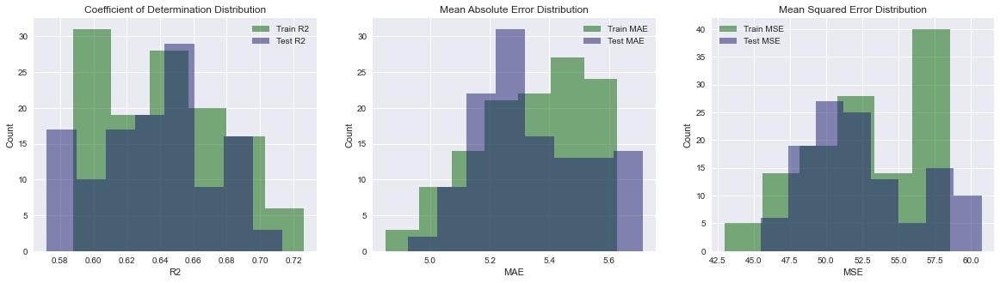

In [122]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(ada_wrapped_svr_pca, PC_train, price_target_train, PC_test, price_target_test )

In [123]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 0.174510020693202
fail to reject the null hypothesis
p-value: 0.8773097526486985
fail to reject the null hypothesis
p-value: 0.6292187486397867
fail to reject the null hypothesis


In [124]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 0.1732223489656114
fail to reject the null hypothesis
p-value: 0.877178775985005
fail to reject the null hypothesis
p-value: 0.6287742772242424
fail to reject the null hypothesis


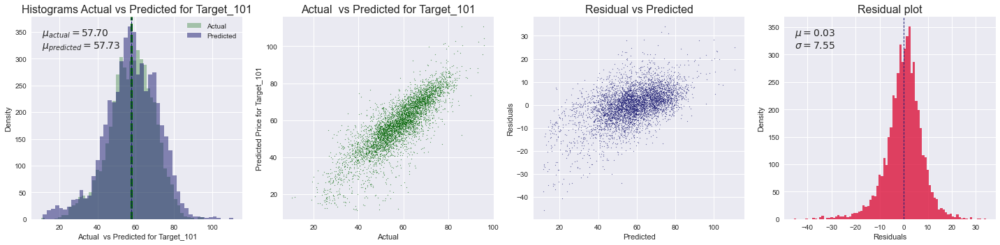

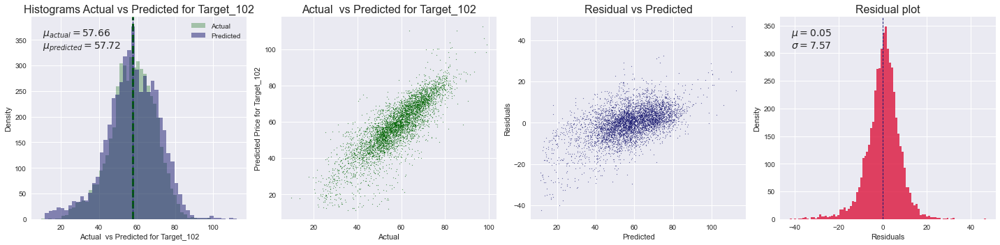

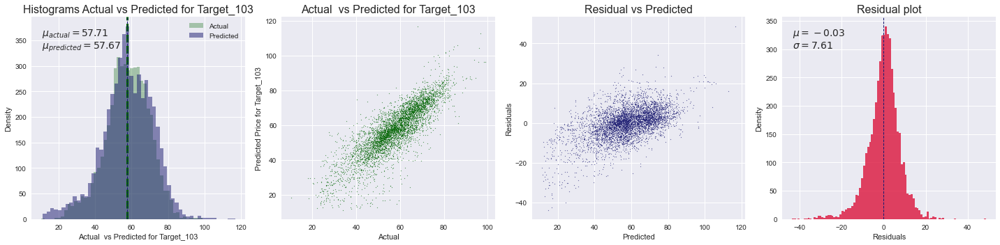

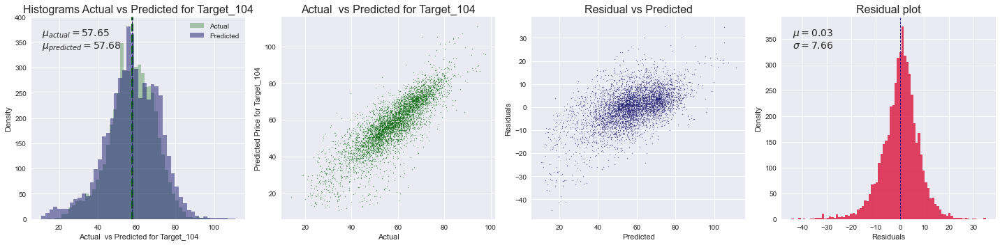

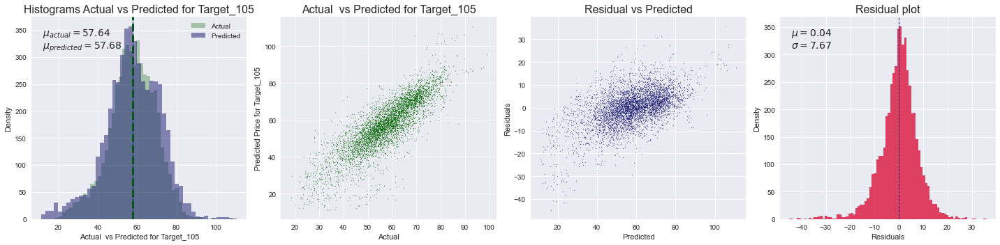

In [125]:
price_prediction = ada_wrapped_svr_pca.predict(PC_test)
price_e_minus_o = get_and_plot_data(price_prediction, price_target_test, start_index=100, stop_index=105)

In [126]:
print(get_ttest (price_prediction, price_target_test, idx=101))

p-value: 0.6042096203667735
we are accepting null hypothesis


In [127]:
print(get_ztest (price_prediction, price_target_test, idx=101))

p-value: 0.6041872630585103
accept null hypothesis


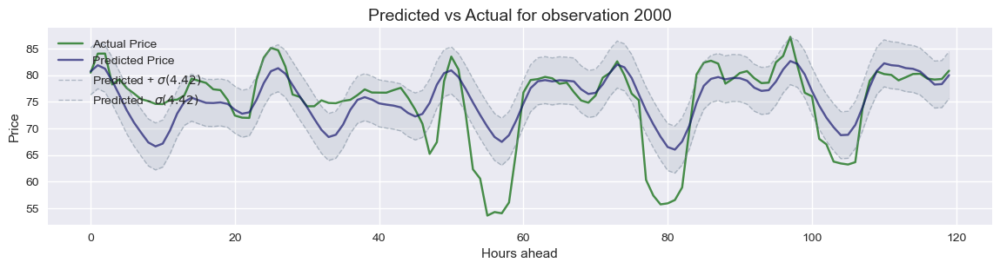

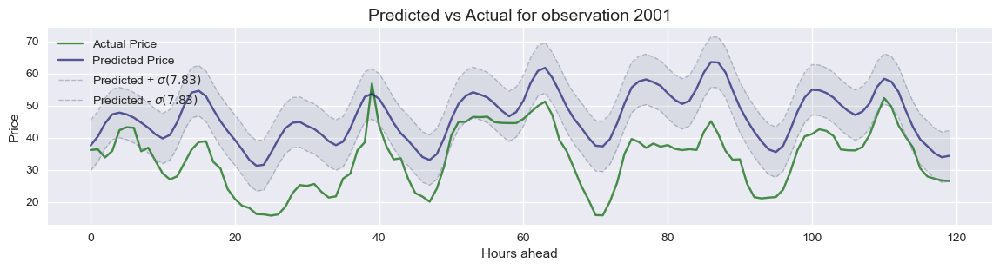

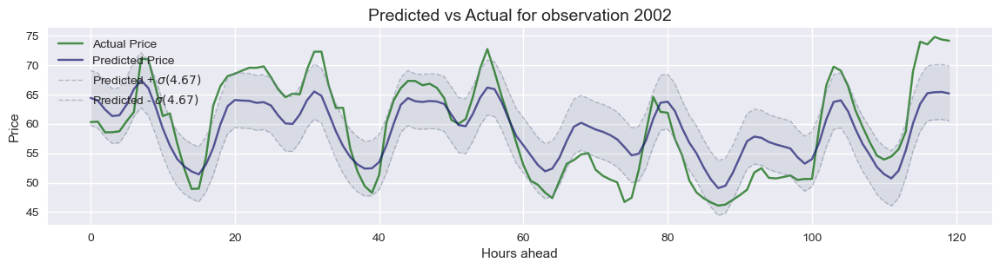

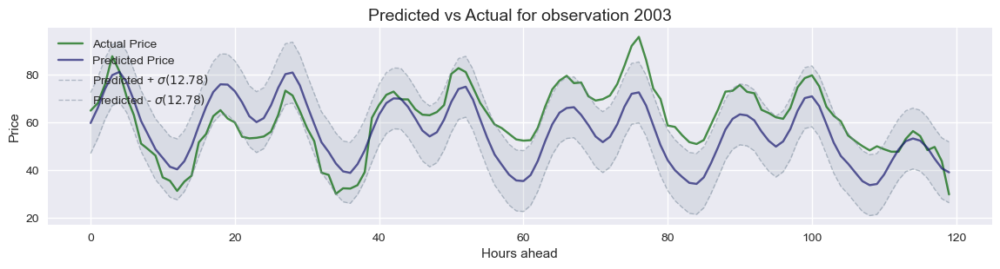

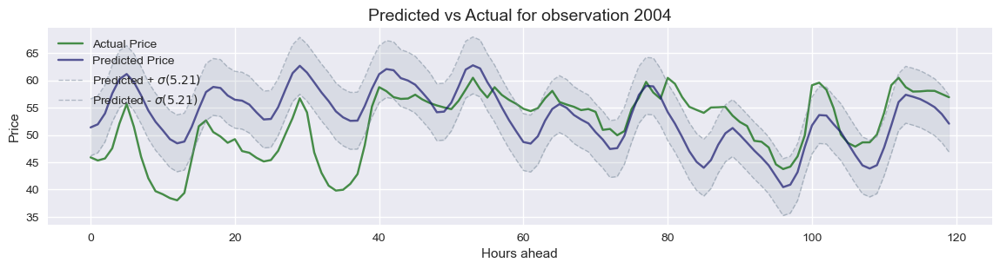

In [128]:
plot_actual_vs_prediction(price_prediction, price_target_test, variable_name = 'Price', start_inx = 2000, end_inx = 2005)

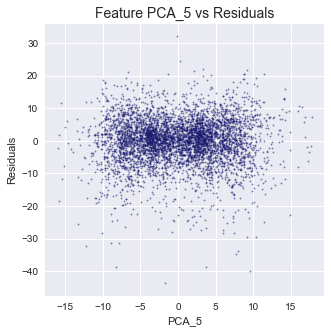

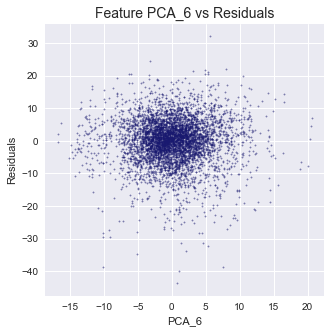

In [129]:
plot_feature_vs_residuals_PCA(PC_test, price_prediction, price_target_test, 
                              start_index=5, stop_index=7, target_indx = 5, col_name = None) 

In [130]:
pd.DataFrame(PC_test).iloc[:, 6].min(), pd.DataFrame(PC_test).iloc[:, 6].max()

(-16.783329482544623, 20.59297149092086)

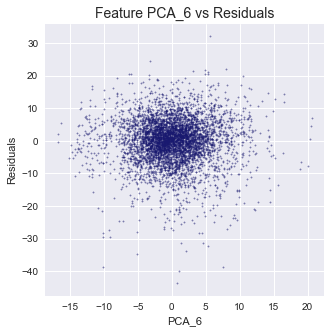

In [131]:
plot_feature_vs_residuals_PCA(PC_test, price_prediction, price_target_test, 
                              start_index=45, stop_index=52, target_indx = 5, col_name = 'PCA_6') 

### Multi-Output Extreme Gradient Boosting (XGBoost)

XGBoost итеративно обучава ансамбъл от плитки дървета, като всяка итерация използва остатъците от грешки на предишния модел, за да пасне на следващия модел. Крайната прогноза е претеглена сума от всички прогнози.

Долната фигура илюстрира принципа на работа на Gradient Boosting моделите.

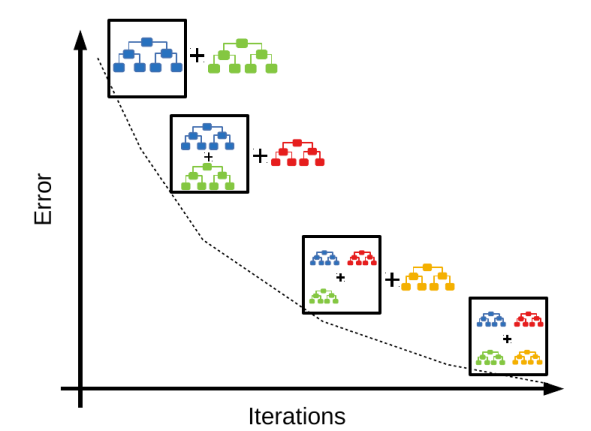

### XGBoost - Test Base Model

In [31]:
# Тестваме за скорост - много бавен и лесно учи наизуст.
@timeit
def xgb_boosting (att, target):
    xgb_test = xgb.XGBRegressor(gamma=0.25,
                                 n_estimators=190,
                                 max_depth=7,
                                 base_score=0.7,
                                 colsample_bytree=0.8,
                                 learning_rate=0.2)
    mo_xgb = MultiOutputRegressor(xgb_test)
    mo_xgb_fitted = mo_xgb.fit(att, target)  
    
    return mo_xgb_fitted

price_xgb = xgb_boosting(PC_train, price_target_train)

Function took 6332.0529 seconds


In [132]:
save_model(price_xgb, "#price_xgb_base_pca.sav")

In [133]:
price_xgb = load_model("#price_xgb_base_pca.sav")

In [134]:
_, _, _ = evaluation_report(price_xgb, PC_train, price_target_train)

Score Results:
Mean squared error: 1.59
Root mean squared error: 1.26
Mean absolute error: 0.94
Coefficient of determination: 0.9921
Predicted mean: 57.731 (13.936)


In [135]:
_, _, _ = evaluation_report(price_xgb, PC_test, price_target_test)

Score Results:
Mean squared error: 13.48
Root mean squared error: 3.67
Mean absolute error: 2.74
Coefficient of determination: 0.9308
Predicted mean: 57.757 (12.981)


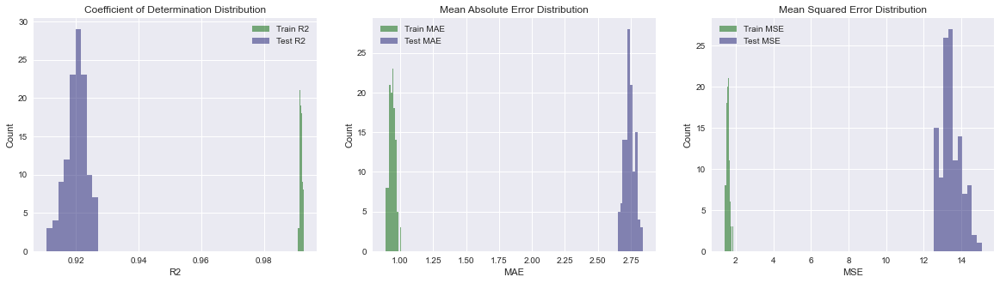

In [136]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(price_xgb, PC_train, price_target_train, PC_test, price_target_test )

In [137]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 3.022371575033075e-283
we are rejecting null hypothesis
p-value: 0.0
we are rejecting null hypothesis
p-value: 3.7843483807046606e-283
we are rejecting null hypothesis


In [138]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 0.0
reject null hypothesis
p-value: 0.0
reject null hypothesis
p-value: 0.0
reject null hypothesis


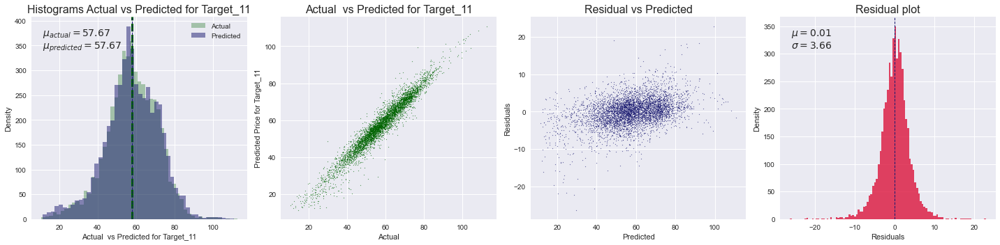

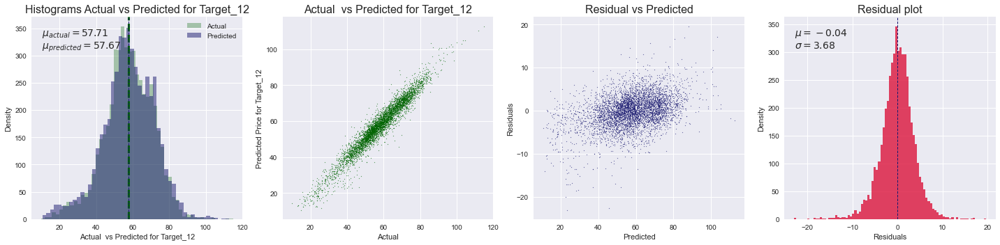

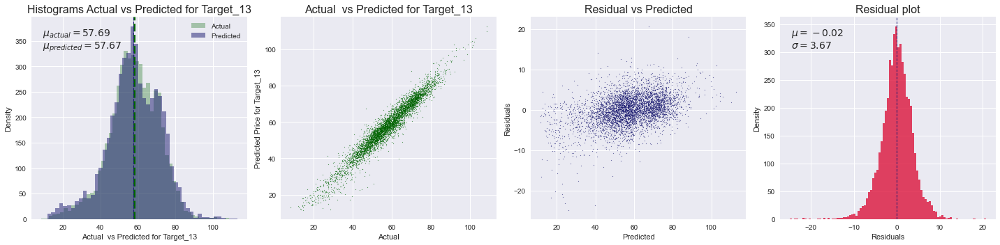

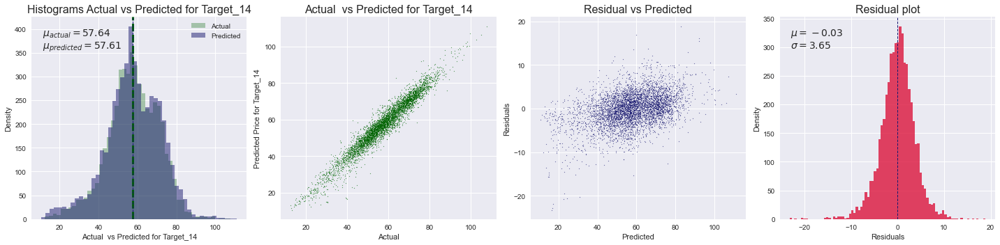

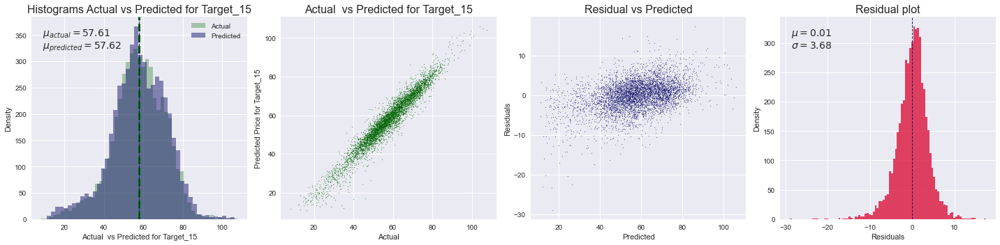

In [139]:
price_prediction_pca = price_xgb.predict(PC_test)
e_minus_o = get_and_plot_data(price_prediction_pca, price_target_test, start_index=10, stop_index=15)

In [140]:
print(get_ttest (price_prediction_pca, price_target_test, idx=15))

p-value: 0.41999617059622774
we are accepting null hypothesis


In [141]:
print(get_ztest (price_prediction_pca, price_target_test, idx=15))

p-value: 0.4199587850870399
accept null hypothesis


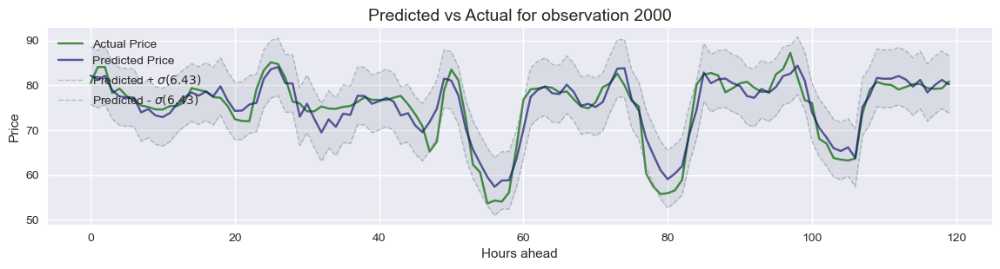

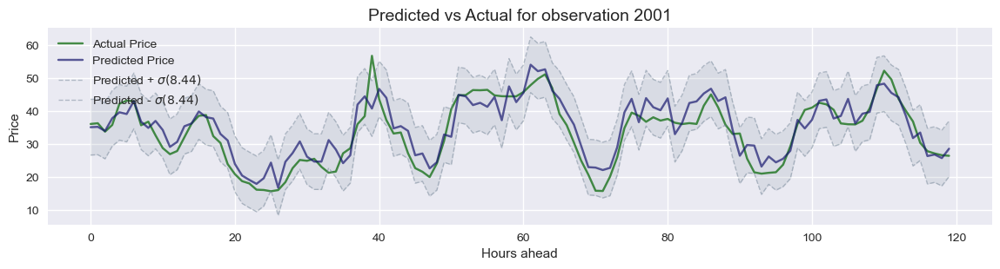

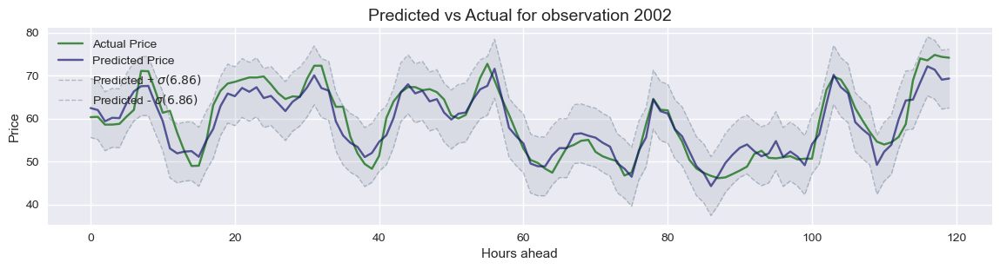

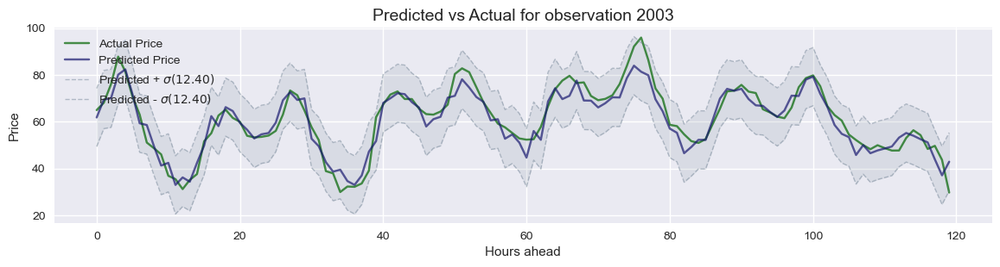

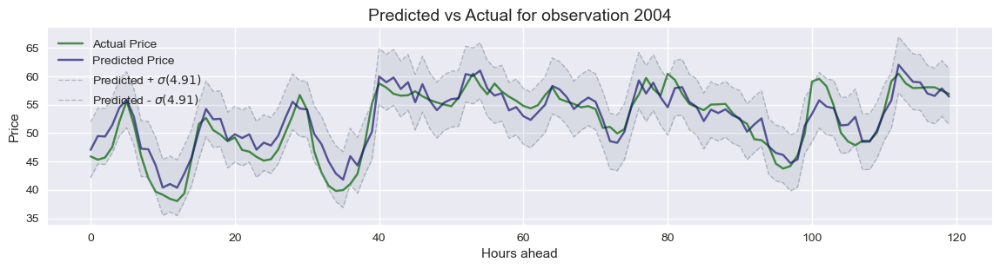

In [142]:
plot_actual_vs_prediction(price_prediction_pca, price_target_test, variable_name = 'Price', start_inx = 2000, end_inx = 2005)

### XGBoost - Optimization

In [143]:
def report_best_scores(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})".format(
                  results['mean_test_score'][candidate],
                  results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")

In [12]:
xgb_model = MultiOutputRegressor(xgb.XGBRegressor())

params = {
    "estimator__colsample_bytree": uniform(0.7, 0.3),
    "estimator__gamma": uniform(0, 0.5),
    "estimator__learning_rate": uniform(0.03, 0.3), # default 0.1 
    "estimator__max_depth": randint(2, 10), # default 3
    "estimator__n_estimators": randint(100, 200), # default 100
    "estimator__subsample": uniform(0.6, 0.4)
}

price_xgb_pca = make_random_grid(xgb_model, params, 
                                 3, PC_train, price_target_train,
                                 n_iter=3)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of   9 | elapsed: 151.8min remaining: 189.7min
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed: 179.5min finished


MultiOutputRegressor(estimator=XGBRegressor(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.8123620356542087,
                                            enable_categorical=False,
                                            gamma=0.4753571532049581,
                                            gpu_id=None, importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=0.24959818254342153,
                                            max_delta_step=None, max_depth=6,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=120, n_jobs=None,
                                 

In [144]:
save_model(price_xgb_pca, "#price_xgb_pca_gs.sav")

In [145]:
price_xgb_pca = load_model("#price_xgb_pca_gs.sav")
price_xgb_pca = price_xgb_pca.best_estimator_

In [146]:
_, _, _ = evaluation_report(price_xgb_pca, PC_train, price_target_train)

Score Results:
Mean squared error: 6.60
Root mean squared error: 2.57
Mean absolute error: 1.98
Coefficient of determination: 0.9670
Predicted mean: 57.730 (13.667)


In [147]:
_, _, _ = evaluation_report(price_xgb_pca, PC_test, price_target_test)

Score Results:
Mean squared error: 18.06
Root mean squared error: 4.25
Mean absolute error: 3.22
Coefficient of determination: 0.9072
Predicted mean: 57.748 (12.986)


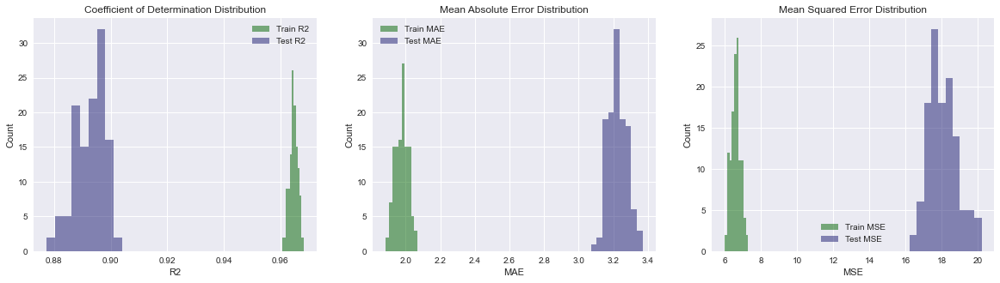

In [148]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(price_xgb_pca, PC_train, price_target_train, PC_test, price_target_test )

In [149]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 1.0752712163163457e-233
we are rejecting null hypothesis
p-value: 5.357835127006877e-269
we are rejecting null hypothesis
p-value: 7.15892905111666e-236
we are rejecting null hypothesis


In [150]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 0.0
reject null hypothesis
p-value: 0.0
reject null hypothesis
p-value: 0.0
reject null hypothesis


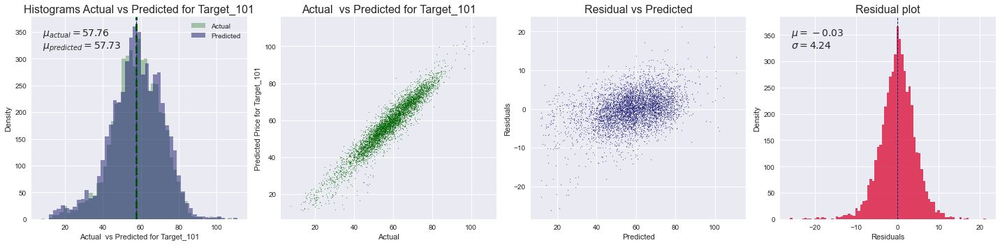

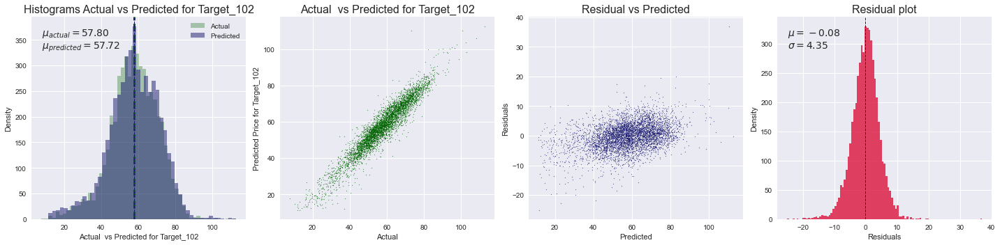

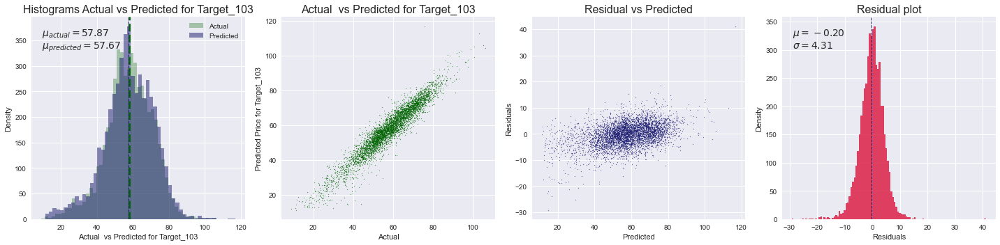

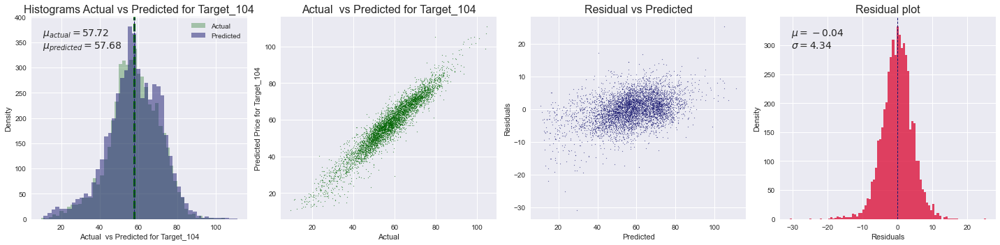

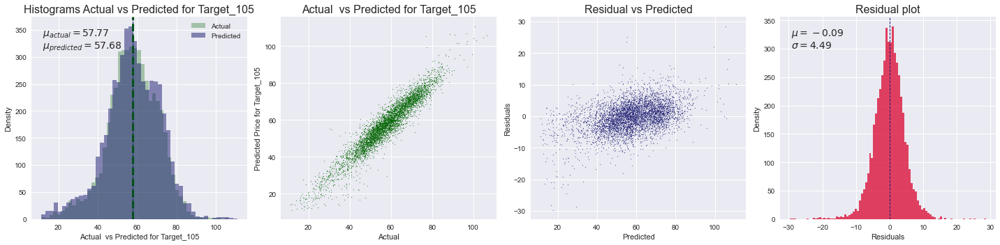

In [151]:
price_prediction_pca = price_xgb_pca.predict(PC_test)
e_minus_o = get_and_plot_data(price_prediction_pca, price_target_test, start_index=100, stop_index=105)

In [152]:
print(get_ttest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.18703952090626483
we are accepting null hypothesis


In [153]:
print(get_ztest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.1869806348828763
accept null hypothesis


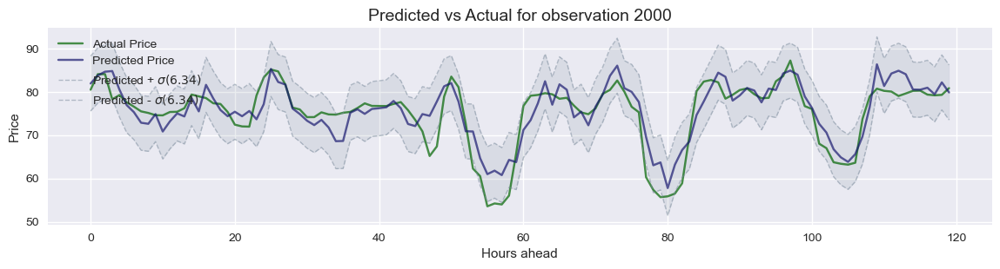

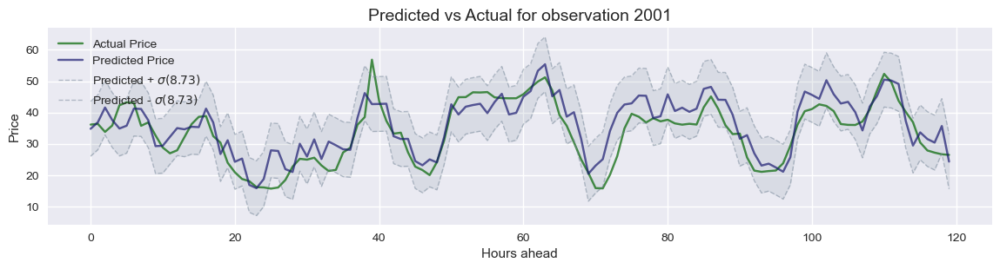

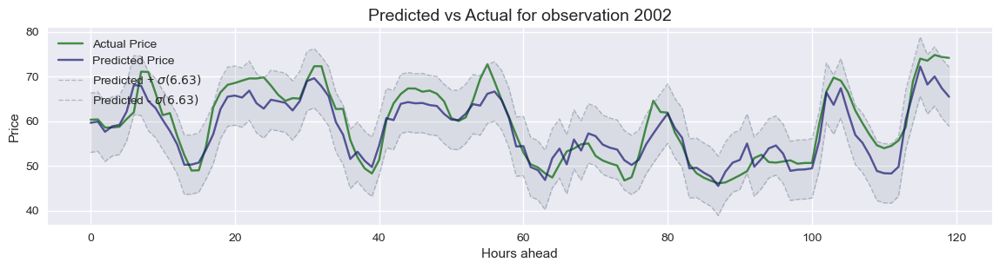

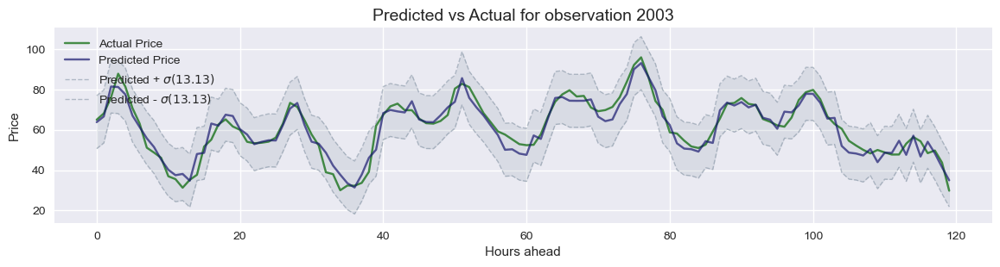

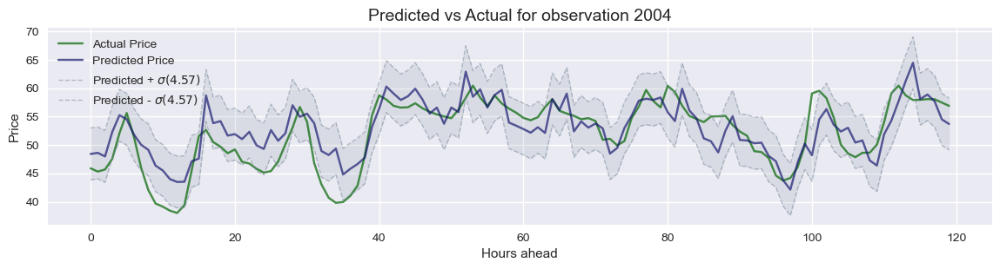

In [154]:
plot_actual_vs_prediction(price_prediction_pca, price_target_test, variable_name = 'Price', start_inx = 2000, end_inx = 2005)

### Some Looks Inside In XGBRegressor

In [155]:
price_xgb_pca = load_model("mo_xgb_cv.sav")
pd.DataFrame(price_xgb_pca.cv_results_).T

,0,1,2,3,4,5,6,7,8,9
mean_fit_time,1616.609541,1647.098882,1302.886412,856.036299,3079.674299,639.24669,921.501239,1557.518732,1873.000259,4176.102674
std_fit_time,60.942756,20.147032,28.306094,119.430301,82.668868,24.379396,53.638938,9.165528,1.483616,330.529993
mean_score_time,2.841091,2.76129,2.231327,2.095715,3.231339,2.123218,1.817591,2.269929,2.267124,4.006019
std_score_time,0.314555,0.077878,0.24326,0.253308,0.118031,0.035785,0.097756,0.012296,0.024908,0.482465
param_estimator__colsample_bytree,0.812362,0.746798,0.716923,0.885244,0.819958,0.885516,0.904092,0.815625,0.848553,0.793513
param_estimator__gamma,0.475357,0.029042,0.360999,0.305827,0.023333,0.191231,0.22525,0.007983,0.017194,0.260034
param_estimator__learning_rate,0.249598,0.289853,0.311566,0.03212,0.322127,0.324969,0.033979,0.099268,0.302796,0.194013
param_estimator__max_depth,6,5,3,2,8,2,2,5,5,7
param_estimator__n_estimators,120,123,163,148,161,102,159,159,149,192
param_estimator__subsample,0.662407,0.860355,0.996885,0.80991,0.636243,0.943976,0.825315,0.648815,0.865009,0.987834


In [156]:
# по интересни комбинации хиперпараметри 5 и 2. Другите имат симптоми на overfitting или са слаби.
pd.DataFrame(price_xgb_pca.cv_results_).T.iloc[:, 5]

mean_fit_time                                                                639.24669
std_fit_time                                                                 24.379396
mean_score_time                                                               2.123218
std_score_time                                                                0.035785
param_estimator__colsample_bytree                                             0.885516
param_estimator__gamma                                                        0.191231
param_estimator__learning_rate                                                0.324969
param_estimator__max_depth                                                           2
param_estimator__n_estimators                                                      102
param_estimator__subsample                                                    0.943976
params                               {'estimator__colsample_bytree': 0.885515802799...
split0_test_score                          

In [157]:
pd.DataFrame(price_xgb_pca.cv_results_).T.iloc[:, 2]

mean_fit_time                                                              1302.886412
std_fit_time                                                                 28.306094
mean_score_time                                                               2.231327
std_score_time                                                                 0.24326
param_estimator__colsample_bytree                                             0.716923
param_estimator__gamma                                                        0.360999
param_estimator__learning_rate                                                0.311566
param_estimator__max_depth                                                           3
param_estimator__n_estimators                                                      163
param_estimator__subsample                                                    0.996885
params                               {'estimator__colsample_bytree': 0.716923473708...
split0_test_score                          

In [74]:
@timeit
def xgb_boosting (att, target):
    xgb_test = xgb.XGBRegressor(gamma=0.36,
                                n_estimators=163,
                                max_depth=3,
                                base_score=0.7,
                                colsample_bytree=0.72,
                                learning_rate=0.31,
                                subsample = 1)
    mo_xgb = MultiOutputRegressor(xgb_test)
    mo_xgb_fitted = mo_xgb.fit(att, target)  
    
    return mo_xgb_fitted

price_xgb_end_test = xgb_boosting(PC_train, price_target_train)

Function took 1739.9540 seconds


In [158]:
save_model(price_xgb_end_test, "#price_xgb_end_test.sav")

In [159]:
price_xgb_end_test = load_model("#price_xgb_end_test.sav")

In [160]:
_, _, _ = evaluation_report(price_xgb_end_test, PC_train, price_target_train)

Score Results:
Mean squared error: 23.86
Root mean squared error: 4.88
Mean absolute error: 3.72
Coefficient of determination: 0.8808
Predicted mean: 57.731 (12.875)


In [161]:
_, _, _ = evaluation_report(price_xgb_end_test, PC_test, price_target_test)

Score Results:
Mean squared error: 30.83
Root mean squared error: 5.55
Mean absolute error: 4.20
Coefficient of determination: 0.8416
Predicted mean: 57.739 (12.515)


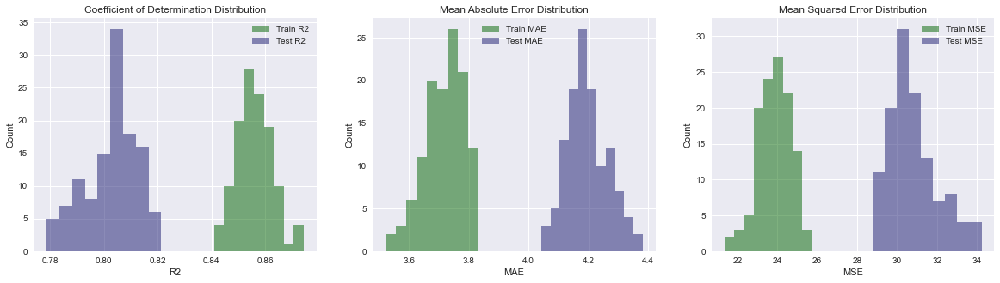

In [162]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(price_xgb_end_test, PC_train, price_target_train, PC_test, price_target_test )

In [163]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 1.7005515179337498e-127
we are rejecting null hypothesis
p-value: 5.1487538944787864e-136
we are rejecting null hypothesis
p-value: 1.5122565418753476e-130
we are rejecting null hypothesis


In [164]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 0.0
reject null hypothesis
p-value: 0.0
reject null hypothesis
p-value: 0.0
reject null hypothesis


In [66]:
@timeit
def xgb_boosting (att, target):
    xgb_test = xgb.XGBRegressor(gamma=0.19,
                                 n_estimators=100,
                                 max_depth=2,
                                 base_score=0.7,
                                 colsample_bytree=0.89,
                                 learning_rate=0.33,
                                 subsample = 0.94)
    mo_xgb = MultiOutputRegressor(xgb_test)
    mo_xgb_fitted = mo_xgb.fit(att, target)  
    
    return mo_xgb_fitted

price_xgb_best = xgb_boosting(PC_train, price_target_train)

Function took 837.3990 seconds


In [165]:
save_model(price_xgb_best, "#price_xgb_best.sav")

In [166]:
price_xgb_best = load_model("#price_xgb_best.sav")

In [167]:
_, _, _ = evaluation_report(price_xgb_best, PC_train, price_target_train)

Score Results:
Mean squared error: 40.05
Root mean squared error: 6.33
Mean absolute error: 4.74
Coefficient of determination: 0.8000
Predicted mean: 57.730 (12.124)


In [168]:
_, _, _ = evaluation_report(price_xgb_best, PC_test, price_target_test)

Score Results:
Mean squared error: 43.60
Root mean squared error: 6.60
Mean absolute error: 4.92
Coefficient of determination: 0.7759
Predicted mean: 57.738 (11.894)


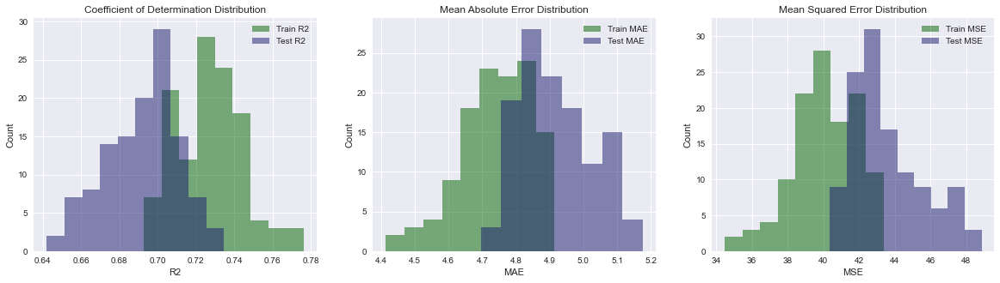

In [169]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(price_xgb_best, PC_train, price_target_train, PC_test, price_target_test )

In [170]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 1.9347722920451397e-37
we are rejecting null hypothesis
p-value: 1.7609360432323595e-31
we are rejecting null hypothesis
p-value: 4.434206060677799e-34
we are rejecting null hypothesis


In [171]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 3.3435134164308535e-53
reject null hypothesis
p-value: 5.3795553938239953e-42
reject null hypothesis
p-value: 1.002242564720055e-46
reject null hypothesis


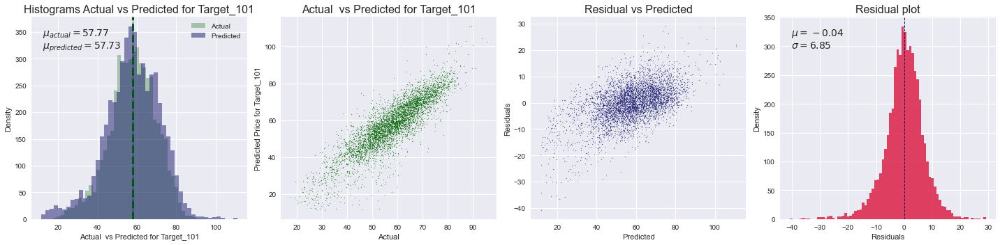

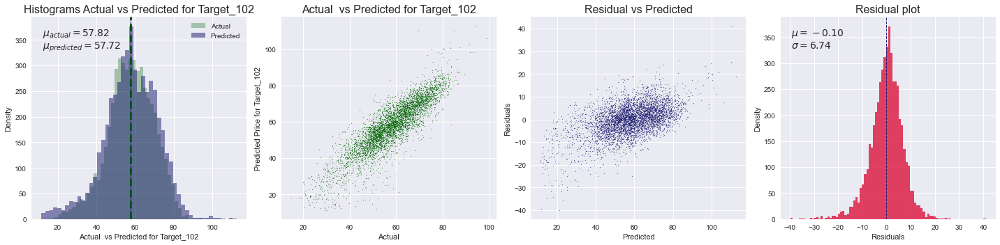

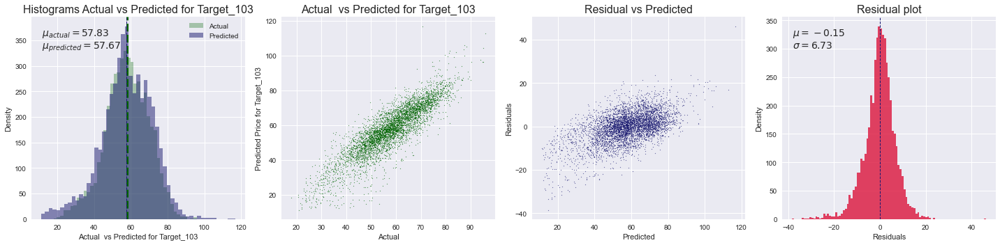

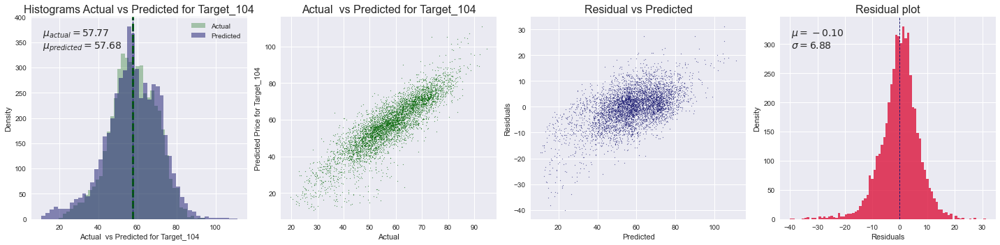

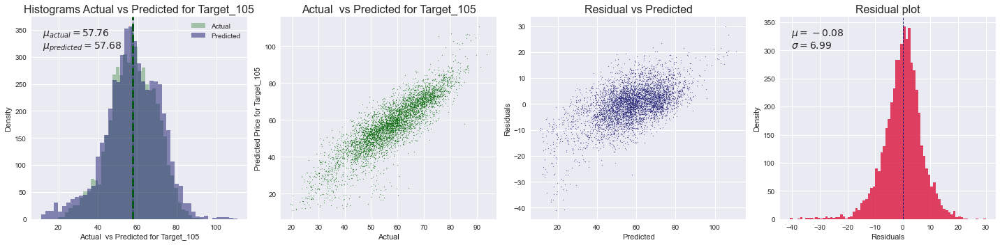

In [172]:
price_prediction_pca = price_xgb_best.predict(PC_test)
e_minus_o = get_and_plot_data(price_prediction_pca, price_target_test, start_index=100, stop_index=105)

In [173]:
print(get_ttest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.3087544994902313
we are accepting null hypothesis


In [174]:
print(get_ztest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.3087064956582799
accept null hypothesis


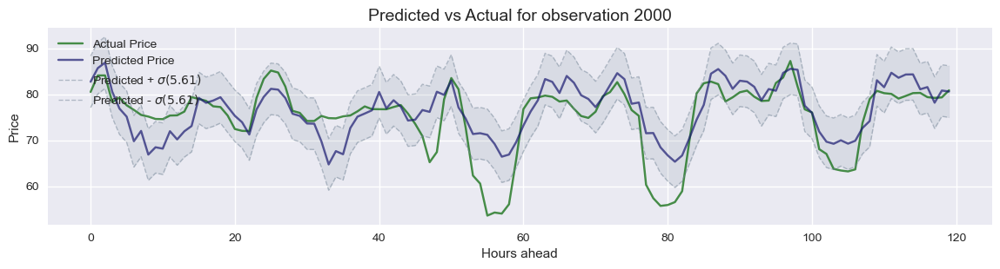

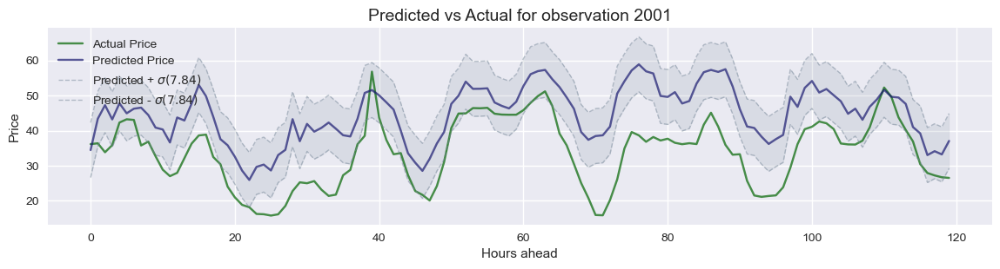

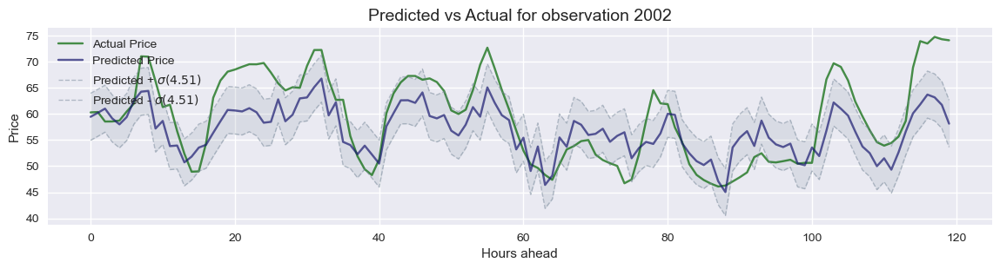

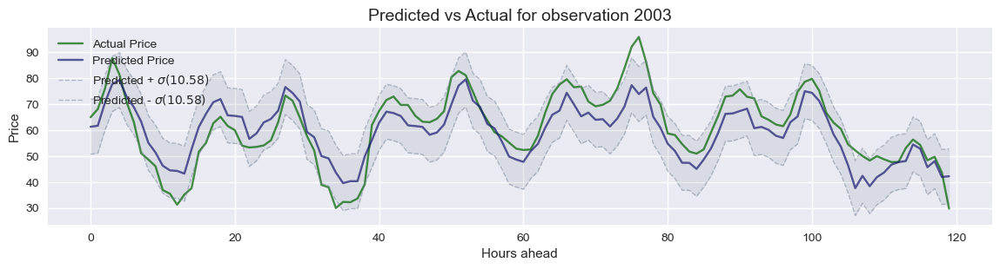

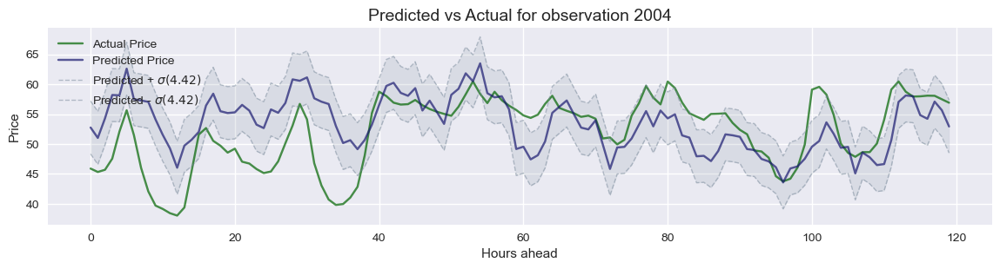

In [175]:
plot_actual_vs_prediction(price_prediction_pca, price_target_test, variable_name = 'Price', start_inx = 2000, end_inx = 2005)

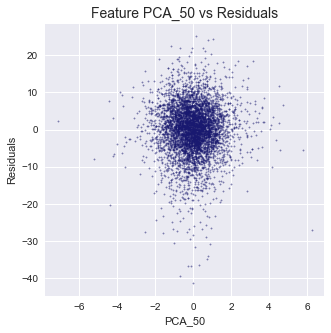

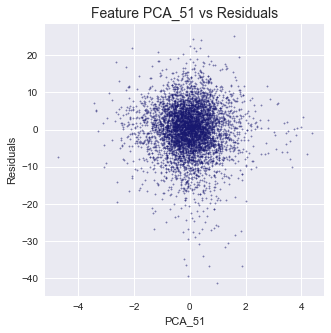

In [176]:
plot_feature_vs_residuals_PCA(PC_test, price_prediction_pca, price_target_test, 
                              start_index=50, stop_index=52, target_indx = 119, col_name = None) 

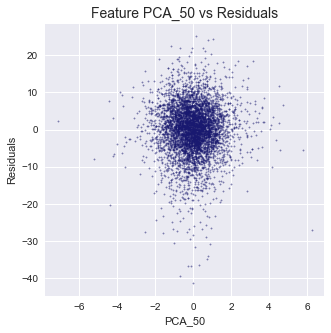

In [177]:
plot_feature_vs_residuals_PCA(PC_test, price_prediction_pca, price_target_test, 
                              start_index=45, stop_index=52, target_indx = 119, col_name = 'PCA_50') 

In [282]:
@timeit
def xgb_boosting (att, target):
    xgb_test = xgb.XGBRegressor(gamma=0.19,
                                 n_estimators=100,
                                 max_depth=1,
                                 base_score=0.7,
                                 colsample_bytree=0.89,
                                 learning_rate=0.25,
                                 subsample = 0.5)
    mo_xgb = MultiOutputRegressor(xgb_test)
    mo_xgb_fitted = mo_xgb.fit(att, target)  
    
    return mo_xgb_fitted

price_xgb = xgb_boosting(PC_train, price_target_train)

Function took 335.8088 seconds


In [178]:
# save_model(price_xgb, "#price_xgb_ne_80_md1_lr25.sav")
# #price_xgb_ne_110_md1_lr25.sav
# #price_xgb_ne_100_md1_lr25.sav

In [179]:
price_xgb = load_model("#price_xgb_ne_110_md1_lr25.sav")

In [180]:
_, _, _ = evaluation_report(price_xgb, PC_train, price_target_train)

Score Results:
Mean squared error: 55.99
Root mean squared error: 7.48
Mean absolute error: 5.52
Coefficient of determination: 0.7204
Predicted mean: 57.729 (10.947)


In [181]:
_, _, _ = evaluation_report(price_xgb, PC_test, price_target_test)

Score Results:
Mean squared error: 56.31
Root mean squared error: 7.50
Mean absolute error: 5.53
Coefficient of determination: 0.7106
Predicted mean: 57.740 (10.798)


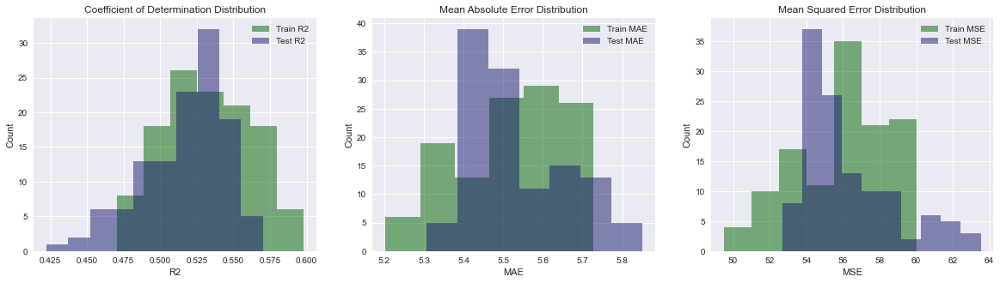

In [182]:
r2_train, r2_test, mae_train, mae_test, mse_train, mse_test = generate_score_distributions(price_xgb, PC_train, price_target_train, PC_test, price_target_test )

In [183]:
pv_r2_ttest = get_ttest_2samples(r2_train, r2_test)
pv_mae_ttest = get_ttest_2samples(mae_train, mae_test)
pv_mse_ttest = get_ttest_2samples(mse_train, mse_test)

p-value: 6.149730044163034e-05
we are rejecting null hypothesis
p-value: 0.44025964089334346
fail to reject the null hypothesis
p-value: 0.3228258498057679
fail to reject the null hypothesis


In [184]:
pv_r2_ztest = get_ztest_2samples(r2_train, r2_test)
pv_mae_ztest = get_ztest_2samples(mae_train, mae_test)
pv_mse_ztest = get_ztest_2samples(mse_train, mse_test)

p-value: 4.5048358084282535e-05
reject null hypothesis
p-value: 0.43949256584214713
fail to reject the null hypothesis
p-value: 0.32181969075378325
fail to reject the null hypothesis


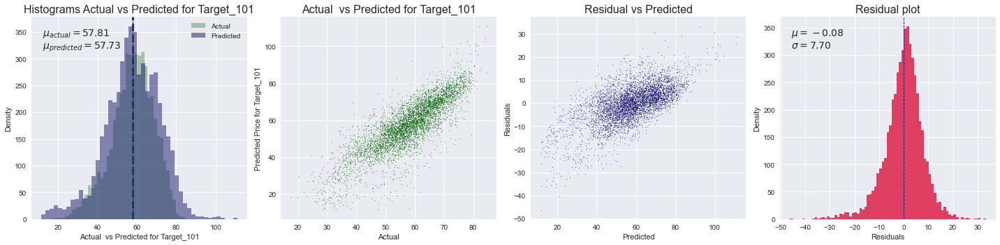

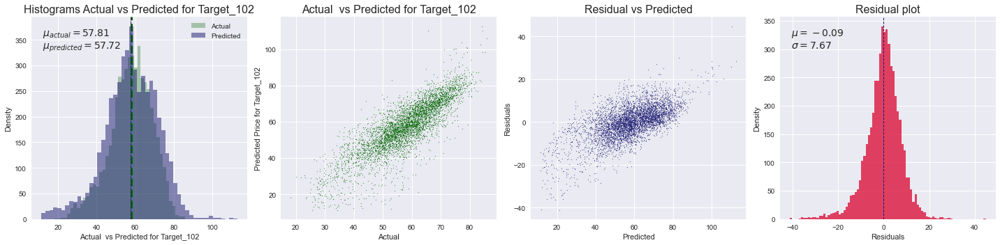

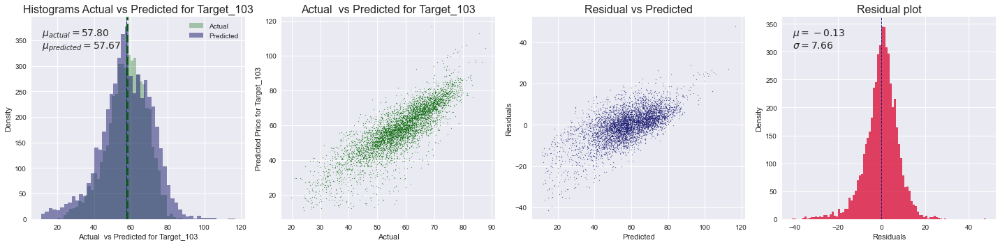

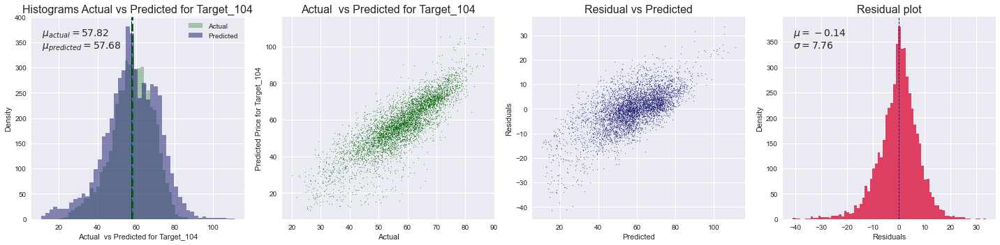

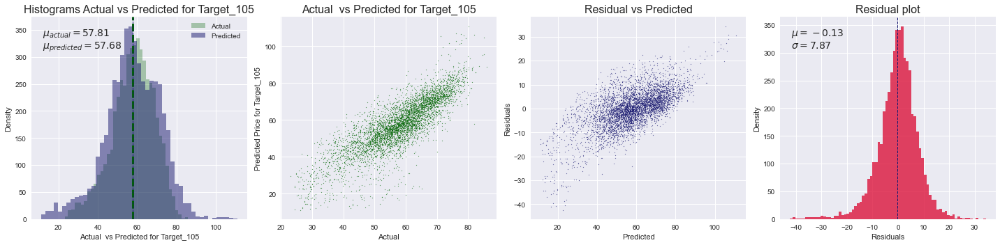

In [185]:
price_prediction_pca = price_xgb.predict(PC_test)
e_minus_o = get_and_plot_data(price_prediction_pca, price_target_test, start_index=100, stop_index=105)

In [186]:
print(get_ttest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.4109230747911353
we are accepting null hypothesis


In [187]:
print(get_ztest (price_prediction_pca, price_target_test, idx=101))

p-value: 0.41088485510849726
accept null hypothesis


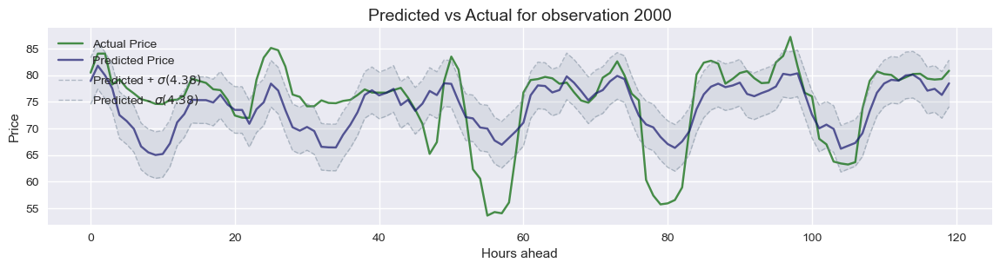

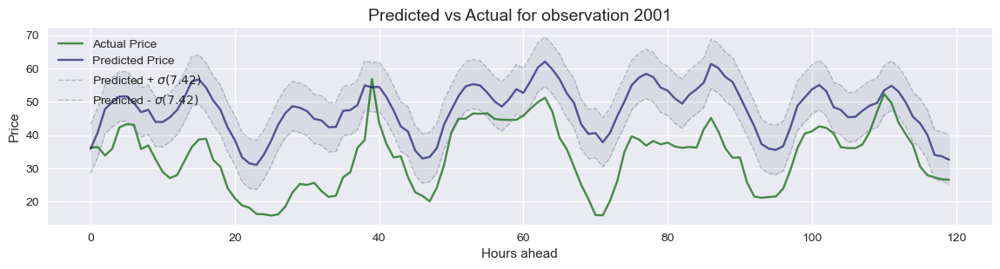

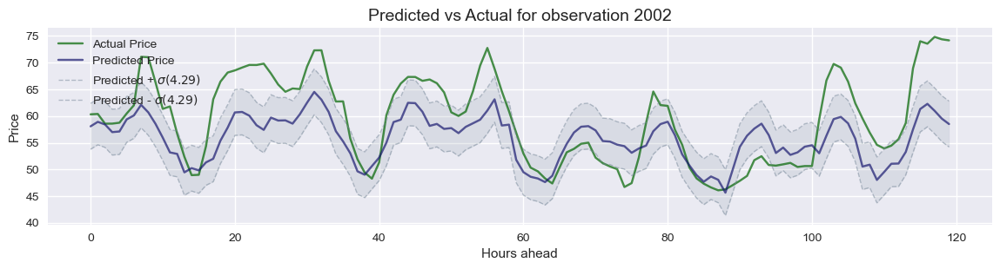

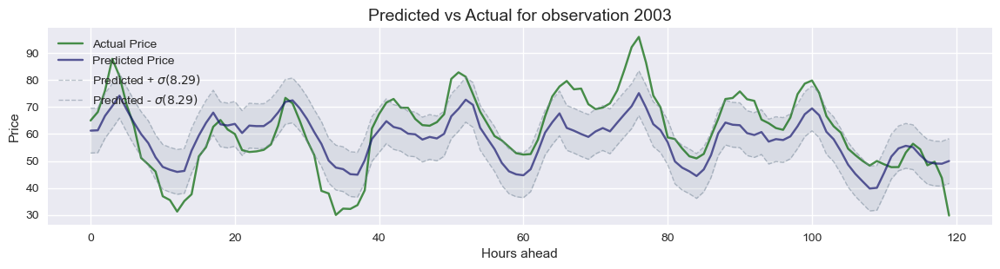

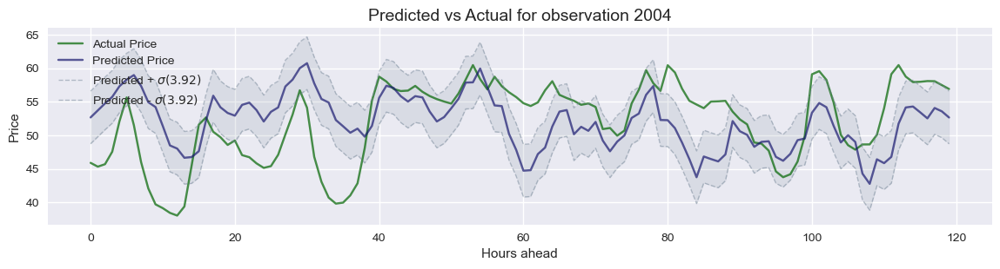

In [188]:
plot_actual_vs_prediction(price_prediction_pca, price_target_test, variable_name = 'Price', start_inx = 2000, end_inx = 2005)

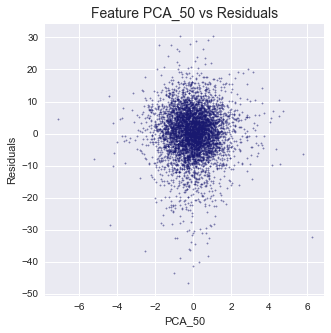

In [189]:
plot_feature_vs_residuals_PCA(PC_test, price_prediction_pca, price_target_test, 
                              start_index=50, stop_index=51, target_indx = 119, col_name = None) 

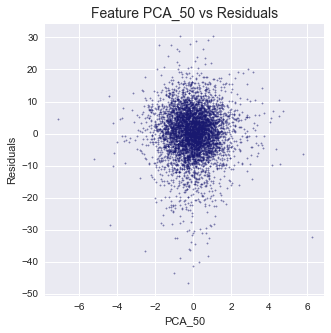

In [190]:
plot_feature_vs_residuals_PCA(PC_test, price_prediction_pca, price_target_test, 
                              start_index=45, stop_index=52, target_indx = 119, col_name = 'PCA_50') 